# <u>Steam Store Games Dataset Analysis<u/>

## Table of Contents

* [About Dataset](#section1)<br>
* [Importing packages](#section2)
    - * [read data set](#section3)<br/>
    - * [Understanding the Dataset](#section4)<br/>
    - * [Clean Data ](#section5)<br/>
        - * [Splitting Data ](#section6)<br/>    
    - * [Save clean Data ](#section7)<br/>
    - * [ EDA & Visualization ](#section8)<br/>
    - * [ Univariate ](#section9)<br/>
        - * [ What is the 5 most frequent games?](#section10)<br/>    
        - * [ Distribution of required_age](#section11)<br/>
        - * [ Distribution of price](#section18)<br/>
        - * [ Distribution of achievements](#section12)<br/>
        - * [ Distribution of positive_ratings and negative_ratings](#section13)<br/>
        - * [ Distribution of average_playtime and median_playtime ](#section14)<br/>
        - * [ How many games are english or not ? ](#section15)<br/>
        - * [ What is the 5 most frequent developer ? ](#section16)<br/>
        - * [ What is the 5 most frequent of publisher ? ](#section17)<br/>
        - * [ How many value count of each required age ](#section19)<br/>
        - * [ What is the 5 most categories are played? ](#section20)<br/>
    - * [ Bivariate ](#section21)<br/>
        - * [ What is the 5 most expensive games? (name/price)](#section22)<br/>
        - * [ What is average  price games  that are published for each years ?(year_of_released/price)](#section23)<br/>
        - * [ What is the average price games of windows? (platforms_windows /price))](#section24)<br/>
        - * [ What is the average price games of Mac? (platforms_mac /price)](#section25)<br/>
        - * [ What is the average price games of Linux? (platforms_linux /price)](#section26)<br/>
        - * [  What is the 5 most developer for windows?(platforms_windows/developer)](#section27)<br/>
        - * [  What is the 5 most developer for Mac?(platforms_mac/developer)](#section28)<br/>
        - * [  What is the 5 most developer for Linux?(platforms_linux/developer)](#section29)<br/>
        - * [  What is the 5 most developer which have positive ratings?(developer/positive_ratings)](#section30)<br/>
        - * [  What is the 5 most developer which have negative ratings ?(developer/negative_ratings)](#section31)<br/>
        - * [  What is the 5 highest genres have average play time?(genres/average_playtime)](#section32)<br/>
        - * [  What is the 5 lowerest genres have average play time?(genres/average_playtime)](#section33)<br/>
    - * [ Multivariate ](#section34)<br/>
        - * [  What is the 5 most expensive develpoer for windows ? (platforms_windows/ developer /price)](#section35)<br/>
        - * [  What is the 5 most expensive develpoer for mac? (platforms_mac /developer /price)](#section36)<br/>
        - * [  What is the 5 most expensive develpoer for linux ?(platforms_linux/developer/price)](#section37)<br/>
        - * [  What is the average price of reach year if english or not ?(year_of_released / english / price )](#section38)<br/>
        - * [  What is the average playtime for required age to platform's windows ?(platforms_window s/ required_age / average_playtime)](#section39)<br/>
        - * [  What is the average playtime for required age to platform's mac ?(platforms_mac / required_age / average_playtime)](#section40)<br/>
        - * [  What is the average playtime for required age to platform's linux ?(platforms_linux / required_age / average_playtime)](#section41)<br/>
        - * [  What is the top 10 developer have positive ratings and what is it genres ? (developer / genres /positive_ratings))](#section42)<br/>
        - * [  What is the top 10 developer have negative ratings and what is it genres?(developer / genres / negative_ratings)](#section43)<br/>
        
* [Conclusions](#section44)<br/>

<a id=section1></a>

## About Dataset:

###### I wanted to create a dataset from scratch based around games on the Steam Store. Using data  [gathered from the Steam Store and SteamSpy APIs](https://nik-davis.github.io/posts/2019/steam-data-collection/), this dataset provides information about various aspects of games on the store, such as its genre and the estimated number of owners.

Gathered around May 2019, it contains most games on the store released prior to that date. Unreleased titles were removed as well as many non-games like software, though some may have slipped through.

<a id=section2></a>

## Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
%matplotlib inline

In [2]:
sns.set(rc={'figure.figsize':[9,9]},font_scale=1.2)

 <a id=section3></a>

####  Read Dataset

In [3]:
df=pd.read_csv("steam.csv").reset_index()
df

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
0,0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,7.19
1,1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,3.99
2,2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,3.99
3,3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,3.99
4,4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,3.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27070,27070,1065230,Room of Pandora,2019-04-24,1,SHEN JIAWEI,SHEN JIAWEI,windows,0,Single-player;Steam Achievements,Adventure;Casual;Indie,Adventure;Indie;Casual,7,3,0,0,0,0-20000,2.09
27071,27071,1065570,Cyber Gun,2019-04-23,1,Semyon Maximov,BekkerDev Studio,windows,0,Single-player,Action;Adventure;Indie,Action;Indie;Adventure,0,8,1,0,0,0-20000,1.69
27072,27072,1065650,Super Star Blast,2019-04-24,1,EntwicklerX,EntwicklerX,windows,0,Single-player;Multi-player;Co-op;Shared/Split ...,Action;Casual;Indie,Action;Indie;Casual,24,0,1,0,0,0-20000,3.99
27073,27073,1066700,New Yankee 7: Deer Hunters,2019-04-17,1,Yustas Game Studio,Alawar Entertainment,windows;mac,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,2,0,0,0,0-20000,5.19


<a id=section4></a>

## Understanding the Dataset


- Lets check our data shape:
- __Dataset__  has __27075 rows__ and __19 columns.__

In [4]:
df.shape

(27075, 19)

In [5]:
df.columns    #This will print the names of all columns.

Index(['index', 'appid', 'name', 'release_date', 'english', 'developer',
       'publisher', 'platforms', 'required_age', 'categories', 'genres',
       'steamspy_tags', 'achievements', 'positive_ratings', 'negative_ratings',
       'average_playtime', 'median_playtime', 'owners', 'price'],
      dtype='object')

In [6]:
df.head()  # Will give you first 5 records

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
0,0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,7.19
1,1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,3.99
2,2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,3.99
3,3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,3.99
4,4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,3.99


In [7]:
df.tail()  # This will print the last n rows of the Data Frame

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
27070,27070,1065230,Room of Pandora,2019-04-24,1,SHEN JIAWEI,SHEN JIAWEI,windows,0,Single-player;Steam Achievements,Adventure;Casual;Indie,Adventure;Indie;Casual,7,3,0,0,0,0-20000,2.09
27071,27071,1065570,Cyber Gun,2019-04-23,1,Semyon Maximov,BekkerDev Studio,windows,0,Single-player,Action;Adventure;Indie,Action;Indie;Adventure,0,8,1,0,0,0-20000,1.69
27072,27072,1065650,Super Star Blast,2019-04-24,1,EntwicklerX,EntwicklerX,windows,0,Single-player;Multi-player;Co-op;Shared/Split ...,Action;Casual;Indie,Action;Indie;Casual,24,0,1,0,0,0-20000,3.99
27073,27073,1066700,New Yankee 7: Deer Hunters,2019-04-17,1,Yustas Game Studio,Alawar Entertainment,windows;mac,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,2,0,0,0,0-20000,5.19
27074,27074,1069460,Rune Lord,2019-04-24,1,Adept Studios GD,Alawar Entertainment,windows;mac,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,4,0,0,0,0-20000,5.19


In [8]:
#gain insights of your data set and see general information about each feature and the total number of non-null values in each variable

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27075 entries, 0 to 27074
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             27075 non-null  int64  
 1   appid             27075 non-null  int64  
 2   name              27075 non-null  object 
 3   release_date      27075 non-null  object 
 4   english           27075 non-null  int64  
 5   developer         27075 non-null  object 
 6   publisher         27075 non-null  object 
 7   platforms         27075 non-null  object 
 8   required_age      27075 non-null  int64  
 9   categories        27075 non-null  object 
 10  genres            27075 non-null  object 
 11  steamspy_tags     27075 non-null  object 
 12  achievements      27075 non-null  int64  
 13  positive_ratings  27075 non-null  int64  
 14  negative_ratings  27075 non-null  int64  
 15  average_playtime  27075 non-null  int64  
 16  median_playtime   27075 non-null  int64 


Well as a first observation we can see that we are lucky, we dont have any missing values 
(27075 complete data) and 19 columns.but we have some feature we need to convert his datatype like [__release_date__]


<a id=section5></a>

## Clean Data 

In [9]:
df_clean=df.copy()

###### convert datatype of release_date to date_time

In [10]:
df_clean["release_date"]=pd.to_datetime(df["release_date"])

###### make parsing

In [11]:
#make a new column for year of released game

df_clean["year_of_released"]=df_clean["release_date"].dt.year

In [12]:
#make a new column for month of released game


df_clean["month_of_released"]=df_clean["release_date"].dt.month

In [13]:
#make a new column for day of released game


df_clean["day_of_released"]=df_clean["release_date"].dt.day

In [14]:
#to check
df_clean.head()

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,...,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released
0,0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,0,124534,3339,17612,317,10000000-20000000,7.19,2000,11,1
1,1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,0,3318,633,277,62,5000000-10000000,3.99,1999,4,1
2,2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,...,0,3416,398,187,34,5000000-10000000,3.99,2003,5,1
3,3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,0,1273,267,258,184,5000000-10000000,3.99,2001,6,1
4,4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,...,0,5250,288,624,415,5000000-10000000,3.99,1999,11,1


###### Determine if found duplicated or nall

In [15]:
df_clean.duplicated().sum()

0

In [16]:
df_clean.isna().sum()

index                0
appid                0
name                 0
release_date         0
english              0
developer            0
publisher            0
platforms            0
required_age         0
categories           0
genres               0
steamspy_tags        0
achievements         0
positive_ratings     0
negative_ratings     0
average_playtime     0
median_playtime      0
owners               0
price                0
year_of_released     0
month_of_released    0
day_of_released      0
dtype: int64

we don't have any duplicated data or null data

<a id=section6></a>

## Splitting Data

#### split platforms

In [17]:
df_clean.head(2)

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,...,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released
0,0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,0,124534,3339,17612,317,10000000-20000000,7.19,2000,11,1
1,1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,0,3318,633,277,62,5000000-10000000,3.99,1999,4,1


In [18]:
#make new column content paltform with only windows

df_clean["platforms_windows"]=df_clean["platforms"].str.split(";").str.get(0)
df_clean["platforms_windows"].value_counts()

windows    27070
mac            4
linux          1
Name: platforms_windows, dtype: int64

In [19]:
#make new column content paltform with only mac

df_clean["platforms_mac"]=df_clean["platforms"].str.split(";").str.get(1)
df_clean["platforms_mac"].value_counts()

mac      8062
linux     611
Name: platforms_mac, dtype: int64

In [20]:
#make new column content paltform with only linux
df_clean["platforms_linux"]=df_clean["platforms"].str.split(";").str.get(2)
df_clean["platforms_linux"].value_counts()

linux    4623
Name: platforms_linux, dtype: int64

In [21]:
df_clean.sample(2)

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
19413,19413,773770,The Way of Kings: Escape the Shattered Plains,2018-03-02,1,Arcturus Studios Inc,Arcturus Studios Inc,windows,0,Single-player;Captions available,...,0,0,0-20000,8.29,2018,3,2,windows,NaN,NaN
6147,6147,384230,Block Party Sports,2018-05-03,1,"All-Star Apps, LLC","All-Star Apps, LLC",windows;mac,0,Single-player;Local Multi-Player;Co-op;Local C...,...,0,0,0-20000,4.79,2018,5,3,windows,mac,NaN


###### ----------------------------------------------------------------------------------------------------------------------

#### one-Hot Encoding 

In [22]:
window=pd.get_dummies(df_clean["platforms_windows"]).reset_index()
window

,index,linux,mac,windows
0,0,0,0,1
1,1,0,0,1
2,2,0,0,1
3,3,0,0,1
4,4,0,0,1
...,...,...,...,...
27070,27070,0,0,1
27071,27071,0,0,1
27072,27072,0,0,1
27073,27073,0,0,1


show 3 features because in windows's columns we have 3 values

In [23]:
#to display where the index if not windows
window[(window["mac"]==1) | (window["linux"]==1)]

,index,linux,mac,windows
1413,1413,0,1,0
12479,12479,0,1,0
13387,13387,0,1,0
16662,16662,0,1,0
20530,20530,1,0,0


In [24]:
#this list content all index for mac 
indexs=window[(window["mac"]==1)]["index"].tolist()
indexs

[1413, 12479, 13387, 16662]

In [25]:
mac=pd.get_dummies(df_clean["platforms_mac"],drop_first=True).reset_index()
mac

,index,mac
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1
...,...,...
27070,27070,0
27071,27071,0
27072,27072,0
27073,27073,1


In [26]:
linux=pd.get_dummies(df_clean["platforms_linux"]).reset_index()
linux

,index,linux
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1
...,...,...
27070,27070,0
27071,27071,0
27072,27072,0
27073,27073,0


In [27]:
#megre two dataframe with each other [mac,linux]
d= pd.merge(mac,linux)
d

,index,mac,linux
0,0,1,1
1,1,1,1
2,2,1,1
3,3,1,1
4,4,1,1
...,...,...,...
27070,27070,0,0
27071,27071,0,0
27072,27072,0,0
27073,27073,1,0


In [28]:
#to merge 3 dataframe with each other

final=pd.merge(window,d,on="index")
final

,index,linux_x,mac_x,windows,mac_y,linux_y
0,0,0,0,1,1,1
1,1,0,0,1,1,1
2,2,0,0,1,1,1
3,3,0,0,1,1,1
4,4,0,0,1,1,1
...,...,...,...,...,...,...
27070,27070,0,0,1,0,0
27071,27071,0,0,1,0,0
27072,27072,0,0,1,0,0
27073,27073,0,0,1,1,0


In [29]:
df_clean.head(5)

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,17612,317,10000000-20000000,7.19,2000,11,1,windows,mac,linux
1,1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,277,62,5000000-10000000,3.99,1999,4,1,windows,mac,linux
2,2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,...,187,34,5000000-10000000,3.99,2003,5,1,windows,mac,linux
3,3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,258,184,5000000-10000000,3.99,2001,6,1,windows,mac,linux
4,4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,...,624,415,5000000-10000000,3.99,1999,11,1,windows,mac,linux


In [30]:
final[(final["index"]==1413) | (final["index"]==12479) | (final["index"]==13387) |(final["index"]==16662) | (final["index"]==20530)]

#we have missing data because we have 4 value in column mac_x=1 and not same value in mac_y

,index,linux_x,mac_x,windows,mac_y,linux_y
1413,1413,0,1,0,0,0
12479,12479,0,1,0,0,0
13387,13387,0,1,0,0,0
16662,16662,0,1,0,0,0
20530,20530,1,0,0,0,0


In [31]:
data=final.copy()

In [32]:
#to solve this problem 

for index in indexs: #indexs is list of all indexs if mac_x=1
     data.at[index,"mac_y"]=1 #to replace all mac_y=1 in case mac_x
    
data.at[20530,"linux_y"]=1 #to replace all linux_y=1 in case linux_x

In [33]:
data

,index,linux_x,mac_x,windows,mac_y,linux_y
0,0,0,0,1,1,1
1,1,0,0,1,1,1
2,2,0,0,1,1,1
3,3,0,0,1,1,1
4,4,0,0,1,1,1
...,...,...,...,...,...,...
27070,27070,0,0,1,0,0
27071,27071,0,0,1,0,0
27072,27072,0,0,1,0,0
27073,27073,0,0,1,1,0


In [34]:
#check
data[(data["index"]==1413) | (data["index"]==12479) | (data["index"]==13387) |(data["index"]==16662) | (data["index"]==20530)]


,index,linux_x,mac_x,windows,mac_y,linux_y
1413,1413,0,1,0,1,0
12479,12479,0,1,0,1,0
13387,13387,0,1,0,1,0
16662,16662,0,1,0,1,0
20530,20530,1,0,0,0,1


In [35]:
#delete first and second colmuns

data.drop(["linux_x","mac_x"],axis=1,inplace=True)

In [36]:
# megre this data with orginal data (df_clean)
df_clean=pd.merge(df_clean,data,on="index")

In [37]:
# to check
df_clean.sample(3)

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,...,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux,windows,mac_y,linux_y
13302,13302,591680,Taphouse VR,2018-09-27,1,Catland,Catland,windows,0,Single-player;Steam Achievements;Steam Trading...,...,0.00,2018,9,27,windows,NaN,NaN,1,0,0
21064,21064,820700,Free road,2018-04-24,1,Nikita Makeev,Nikita Makeev,windows,0,Single-player,...,0.79,2018,4,24,windows,NaN,NaN,1,0,0
16596,16596,692030,Tennis World Tour,2018-06-12,1,Breakpoint,Bigben Interactive,windows,0,Single-player;Multi-player;Local Multi-Player;...,...,39.99,2018,6,12,windows,NaN,NaN,1,0,0


In [38]:
# drop some columns
df_clean.drop(["platforms_windows","platforms_mac","platforms_linux"],axis=1,inplace=True)

In [39]:
# rename columns
df_clean.rename(columns={"windows":"platforms_windows",
                          "mac_y":"platforms_mac",
                          "linux_y":"platforms_linux"},inplace=True)


In [40]:
#to check
df_clean

,index,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,17612,317,10000000-20000000,7.19,2000,11,1,1,1,1
1,1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,277,62,5000000-10000000,3.99,1999,4,1,1,1,1
2,2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,...,187,34,5000000-10000000,3.99,2003,5,1,1,1,1
3,3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,...,258,184,5000000-10000000,3.99,2001,6,1,1,1,1
4,4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,...,624,415,5000000-10000000,3.99,1999,11,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27070,27070,1065230,Room of Pandora,2019-04-24,1,SHEN JIAWEI,SHEN JIAWEI,windows,0,Single-player;Steam Achievements,...,0,0,0-20000,2.09,2019,4,24,1,0,0
27071,27071,1065570,Cyber Gun,2019-04-23,1,Semyon Maximov,BekkerDev Studio,windows,0,Single-player,...,0,0,0-20000,1.69,2019,4,23,1,0,0
27072,27072,1065650,Super Star Blast,2019-04-24,1,EntwicklerX,EntwicklerX,windows,0,Single-player;Multi-player;Co-op;Shared/Split ...,...,0,0,0-20000,3.99,2019,4,24,1,0,0
27073,27073,1066700,New Yankee 7: Deer Hunters,2019-04-17,1,Yustas Game Studio,Alawar Entertainment,windows;mac,0,Single-player;Steam Cloud,...,0,0,0-20000,5.19,2019,4,17,1,1,0


In [41]:
# drop [index,appid,platforms] because not need
df_clean.drop(["index","appid","platforms","release_date"],axis=1,inplace=True)

In [42]:
#the final clean data
df_clean

,name,english,developer,publisher,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,Counter-Strike,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,...,17612,317,10000000-20000000,7.19,2000,11,1,1,1,1
1,Team Fortress Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,...,277,62,5000000-10000000,3.99,1999,4,1,1,1,1
2,Day of Defeat,1,Valve,Valve,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,...,187,34,5000000-10000000,3.99,2003,5,1,1,1,1
3,Deathmatch Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,...,258,184,5000000-10000000,3.99,2001,6,1,1,1,1
4,Half-Life: Opposing Force,1,Gearbox Software,Valve,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,...,624,415,5000000-10000000,3.99,1999,11,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27070,Room of Pandora,1,SHEN JIAWEI,SHEN JIAWEI,0,Single-player;Steam Achievements,Adventure;Casual;Indie,Adventure;Indie;Casual,7,3,...,0,0,0-20000,2.09,2019,4,24,1,0,0
27071,Cyber Gun,1,Semyon Maximov,BekkerDev Studio,0,Single-player,Action;Adventure;Indie,Action;Indie;Adventure,0,8,...,0,0,0-20000,1.69,2019,4,23,1,0,0
27072,Super Star Blast,1,EntwicklerX,EntwicklerX,0,Single-player;Multi-player;Co-op;Shared/Split ...,Action;Casual;Indie,Action;Indie;Casual,24,0,...,0,0,0-20000,3.99,2019,4,24,1,0,0
27073,New Yankee 7: Deer Hunters,1,Yustas Game Studio,Alawar Entertainment,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,2,...,0,0,0-20000,5.19,2019,4,17,1,1,0


<a id=section7></a>

## save clean data

In [43]:
df_clean.to_csv(r"/home/ramy/سطح المكتب/ahmed/Data Scince and analysis and AI/Data science cousre Epsilon/final project/stream cleaning.csv")

<a id=section8></a>

# EDA & Visualization

In [44]:
df_eda=df_clean.copy()

In [45]:
df_eda.head(3)

,name,english,developer,publisher,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,Counter-Strike,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,...,17612,317,10000000-20000000,7.19,2000,11,1,1,1,1
1,Team Fortress Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,...,277,62,5000000-10000000,3.99,1999,4,1,1,1,1
2,Day of Defeat,1,Valve,Valve,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,...,187,34,5000000-10000000,3.99,2003,5,1,1,1,1


In [46]:
#You can get idea that gives summary statstics for only intersting numerical features in your data set.
df_eda.describe().drop(["english",
                        "year_of_released",
                        "month_of_released",
                        "day_of_released",
                        "platforms_windows",
                        "platforms_mac",
                        "platforms_linux"],
                       axis=1).round(2)

,required_age,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,price
count,27075.00,27075.00,27075.00,27075.00,27075.00,27075.00,27075.00
mean,0.35,45.25,1000.56,211.03,149.80,146.06,6.08
std,2.41,352.67,18988.72,4284.94,1827.04,2353.88,7.87
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,6.00,2.00,0.00,0.00,1.69
50%,0.00,7.00,24.00,9.00,0.00,0.00,3.99
75%,0.00,23.00,126.00,42.00,0.00,0.00,7.19
max,18.00,9821.00,2644404.00,487076.00,190625.00,190625.00,421.99


In [47]:
df_eda.columns

Index(['name', 'english', 'developer', 'publisher', 'required_age',
       'categories', 'genres', 'steamspy_tags', 'achievements',
       'positive_ratings', 'negative_ratings', 'average_playtime',
       'median_playtime', 'owners', 'price', 'year_of_released',
       'month_of_released', 'day_of_released', 'platforms_windows',
       'platforms_mac', 'platforms_linux'],
      dtype='object')

<a id=section9></a>

# Univariate

<a id=section10></a>

## What is the 5 most frequent games?

In [48]:
#pandas
df_eda["name"].value_counts().head(5).reset_index()

,index,name
0,Dark Matter,3
1,Castles,2
2,Killing Time,2
3,Nightmare Simulator,2
4,Surge,2


Text(0, 0.5, 'frequency')

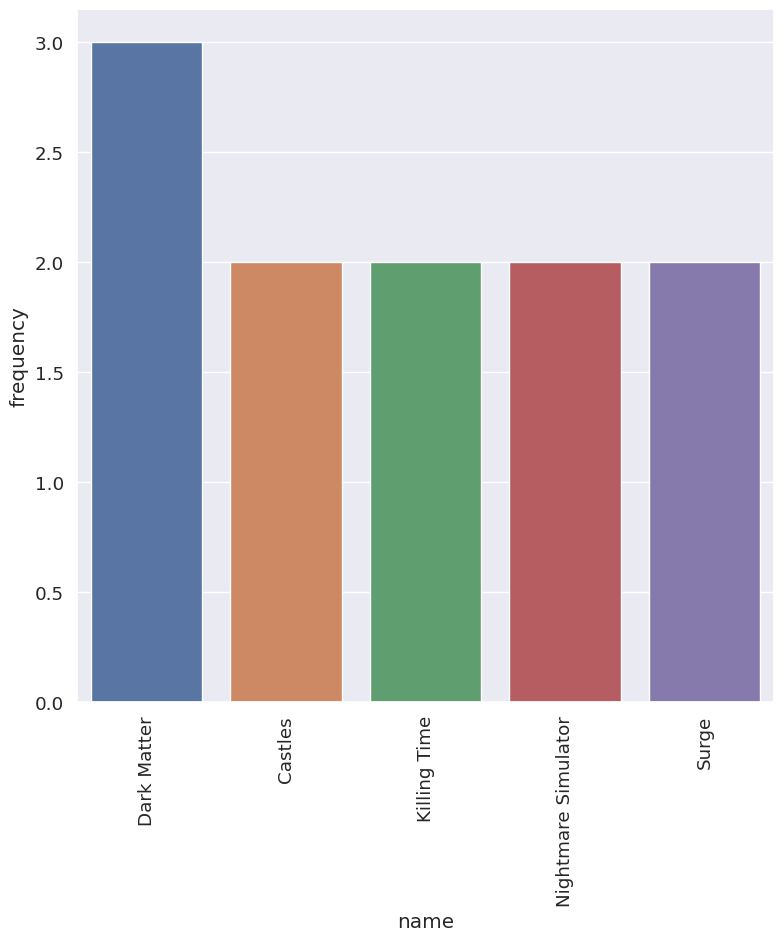

In [49]:
#seaborn
plt.xticks(rotation=90)
sns.barplot(data=df_eda["name"].value_counts().head(5).reset_index(),
             x="index",
             y="name")
plt.xlabel("name")
plt.ylabel("frequency")


In [50]:
#ploty
fig=px.bar(data_frame=df_eda["name"].value_counts().head(5).reset_index(),
        x="name",
        y="index",
        labels={"name":"frequency","index":"name"},
        text_auto="0.2s")
fig.update_traces(textfont_size=12,textposition="outside")

<a id=section11></a>

## Distribution of required age	:

In [51]:
px.histogram(data_frame=df_eda,x=["required_age"])

In [52]:
px.box(data_frame=df_eda,x=["required_age"])

<a id=section12></a>

## Distribution of achievements

In [53]:
px.histogram(data_frame=df_eda,x=["achievements"])

In [54]:
px.box(data_frame=df_eda,x=["achievements"])

we have outliers in achievements

<a id=section18></a>

## Distribution of price

<AxesSubplot:xlabel='price', ylabel='Count'>

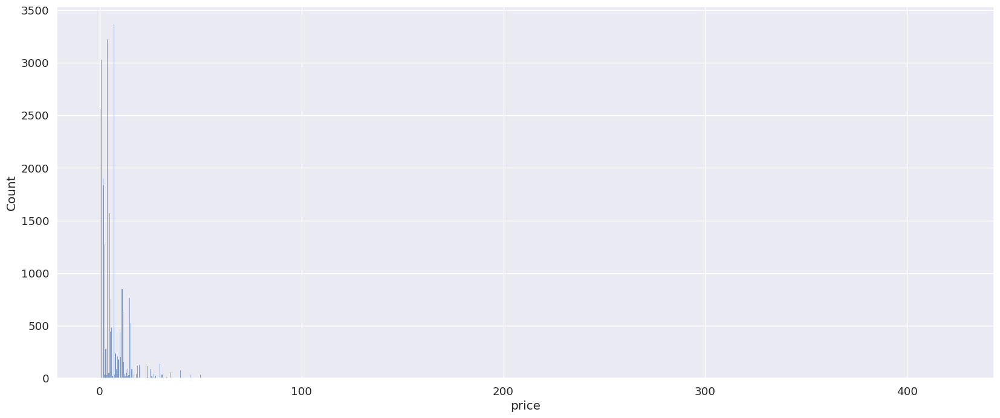

In [55]:
#seaborn
plt.figure(figsize=(20,8))
sns.histplot(data=df_eda,x="price")

In [56]:
px.box(data_frame=df_eda,x="price")

we have outliers in price

<a id=section13></a>

## Distribution of positive_ratings and negative_ratings

In [57]:
px.box(data_frame=df_eda,x=["positive_ratings","negative_ratings"])

we have many outliers in positive_ratings and negative_ratings

<a id=section14></a>

## Distribution of average_playtime and median_playtime

In [58]:
px.box(data_frame=df_eda,x=["average_playtime","median_playtime"])

we have many outliers in average_playtime and median_playtime

<a id=section15></a>

## How many games are english or not ?

In [59]:
#pandas
df_eda["english"].value_counts()

1    26564
0      511
Name: english, dtype: int64

Text(0.5, 1.0, ' How many games are english or not')

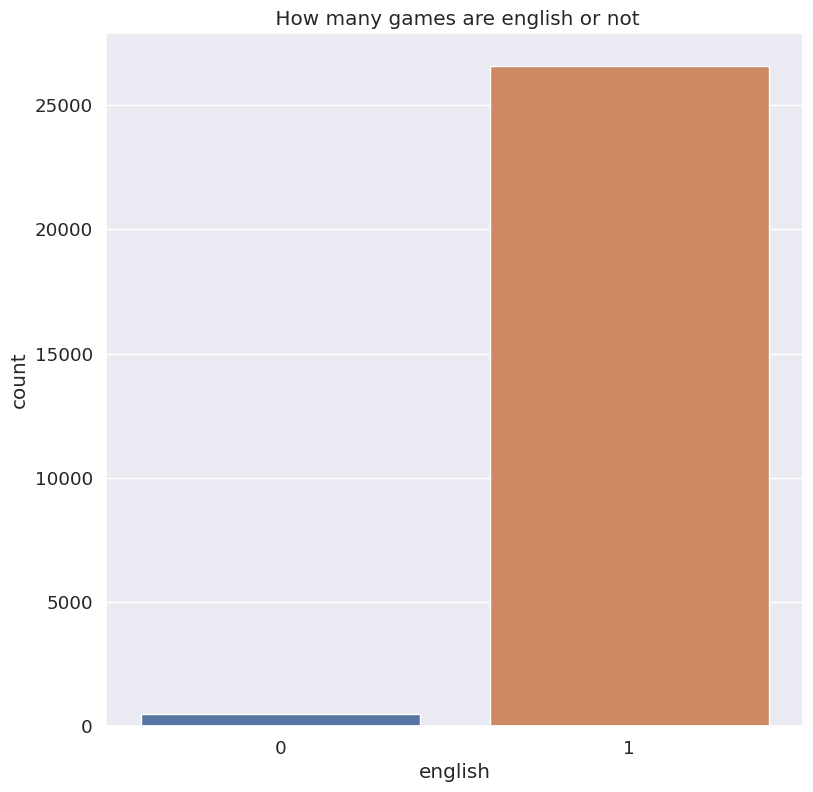

In [60]:
#seaborn 
sns.countplot(data=df_eda,x="english")
plt.title(" How many games are english or not")

In [61]:
#plotly
fig=px.bar(data_frame=df_eda["english"].value_counts(),
            x=df_eda["english"].value_counts().index,
            y=df_eda["english"].value_counts().values,
        labels={"x":"english","y":"count"},
        text_auto="0.2s")
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="How many games are english or not",title_x=0.5)

<a id=section16></a>

## What is the 5 most frequent developer ?

In [62]:
#pandas
df_eda["developer"].value_counts().head(5).reset_index()

,index,developer
0,Choice of Games,94
1,"KOEI TECMO GAMES CO., LTD.",72
2,Ripknot Systems,62
3,Laush Dmitriy Sergeevich,51
4,"Nikita ""Ghost_RUS""",50


Text(0, 0.5, 'frequency')

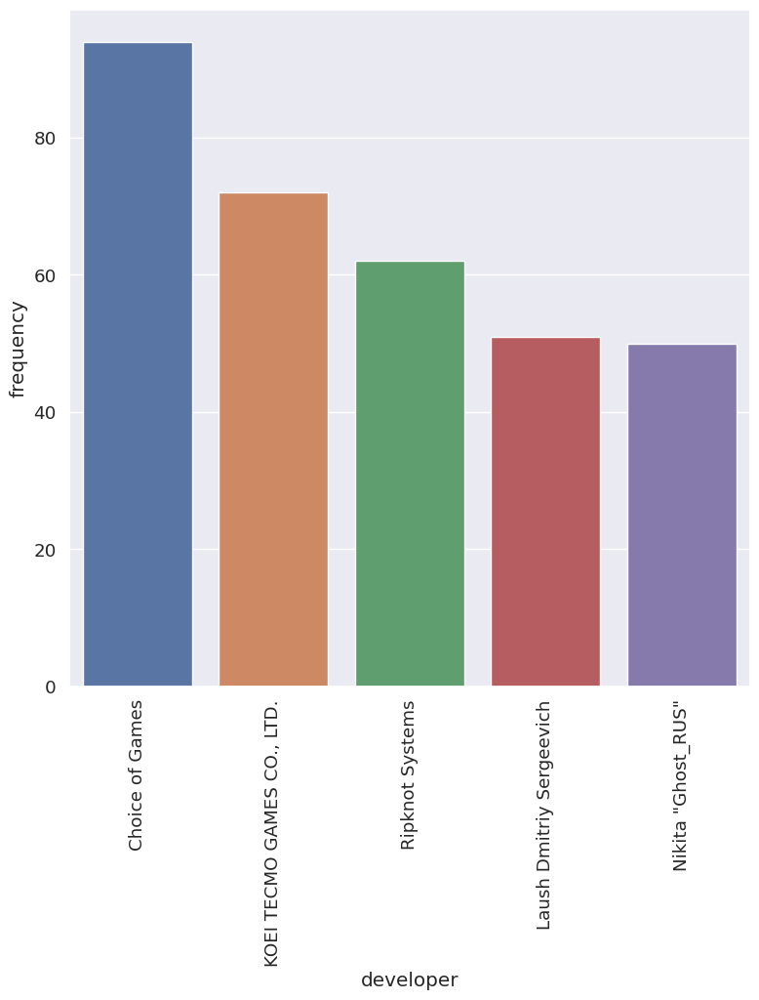

In [63]:
#seaborn
plt.xticks(rotation=90)
sns.barplot(data=df_eda["developer"].value_counts().head(5).reset_index(),
             x="index",
             y="developer")
plt.xlabel("developer")
plt.ylabel("frequency")


In [64]:
#ploty
fig=px.bar(data_frame=df_eda["developer"].value_counts().head(5).reset_index(),
        x="developer",
        y="index",
        labels={"developer":"frequency","index":"developer"},
        text_auto="0.2s")
fig.update_traces(textfont_size=12,textposition="outside")

<a id=section17></a>

## What is the 5 most frequent of publisher ?

In [65]:
#pandas
df_eda["publisher"].value_counts().head(5).reset_index()

,index,publisher
0,Big Fish Games,212
1,Strategy First,136
2,Ubisoft,111
3,THQ Nordic,98
4,Square Enix,97


Text(0, 0.5, 'frequency')

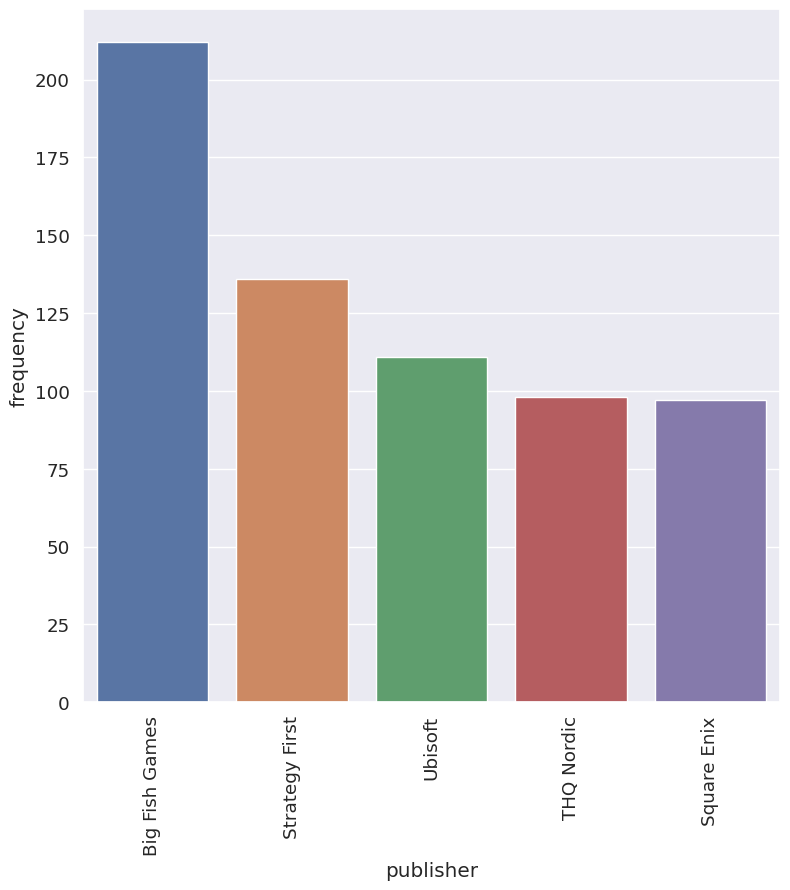

In [66]:
#seaborn
plt.xticks(rotation=90)
sns.barplot(data=df_eda["publisher"].value_counts().head(5).reset_index(),
             x="index",
             y="publisher")
plt.xlabel("publisher")
plt.ylabel("frequency")


In [67]:
#ploty
fig=px.pie(data_frame=df_eda["publisher"].value_counts().head(5).reset_index(),
           names="index",
           values="publisher",
          labels={"index":"publisher","publisher":"frequency"})
fig

<a id=section19></a>

## How many value count of each required age?

In [68]:
#pandas
df_eda["required_age"].value_counts().reset_index().sort_values(by="index")


,index,required_age
0,0,26479
5,3,11
4,7,12
3,12,73
2,16,192
1,18,308


Text(0, 0.5, 'frequency')

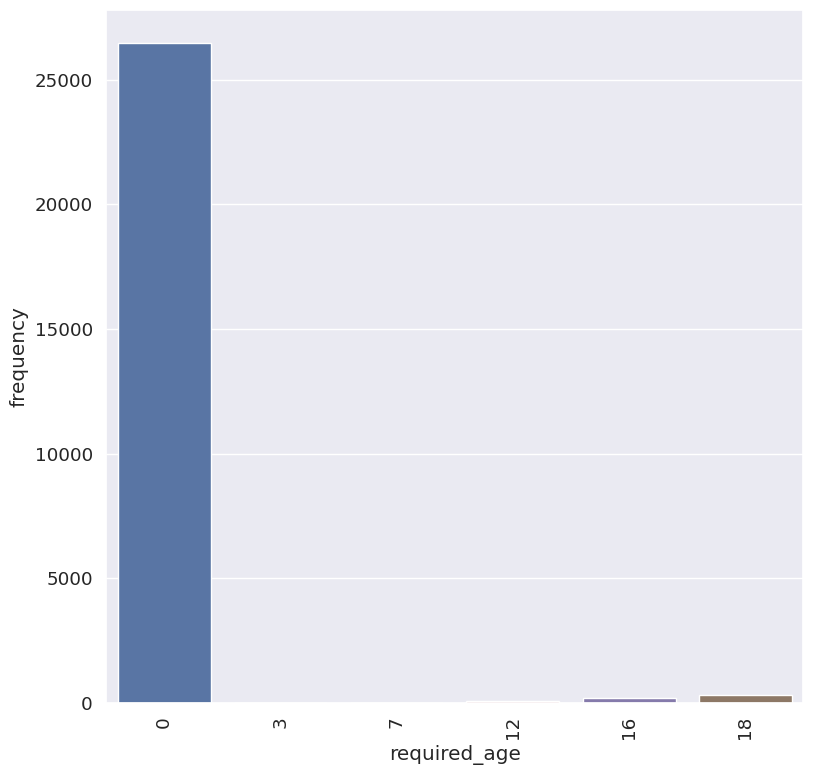

In [69]:
#seaborn
plt.xticks(rotation=90)
sns.barplot(data=df_eda["required_age"].value_counts().reset_index().sort_values(by="index"),
             x="index",
             y="required_age")
plt.xlabel("required_age")
plt.ylabel("frequency")


In [70]:
#ploty
fig=px.bar(data_frame=df_eda["required_age"].value_counts().reset_index().sort_values(by="index"),
        x="index",
        y="required_age",
        labels={"required_age":"frequency","index":"required_age"},
        text_auto="0.2s")
fig.update_traces(textfont_size=12,textposition="outside")

<a id=section20></a>

## What is the 5 most categories are played?

In [71]:
#pandas

df_eda["categories"].value_counts().head(5).reset_index()

,index,categories
0,Single-player,6110
1,Single-player;Steam Achievements,2334
2,Single-player;Steam Achievements;Steam Trading...,848
3,Single-player;Partial Controller Support,804
4,Single-player;Steam Trading Cards,792


Text(0, 0.5, 'frequency')

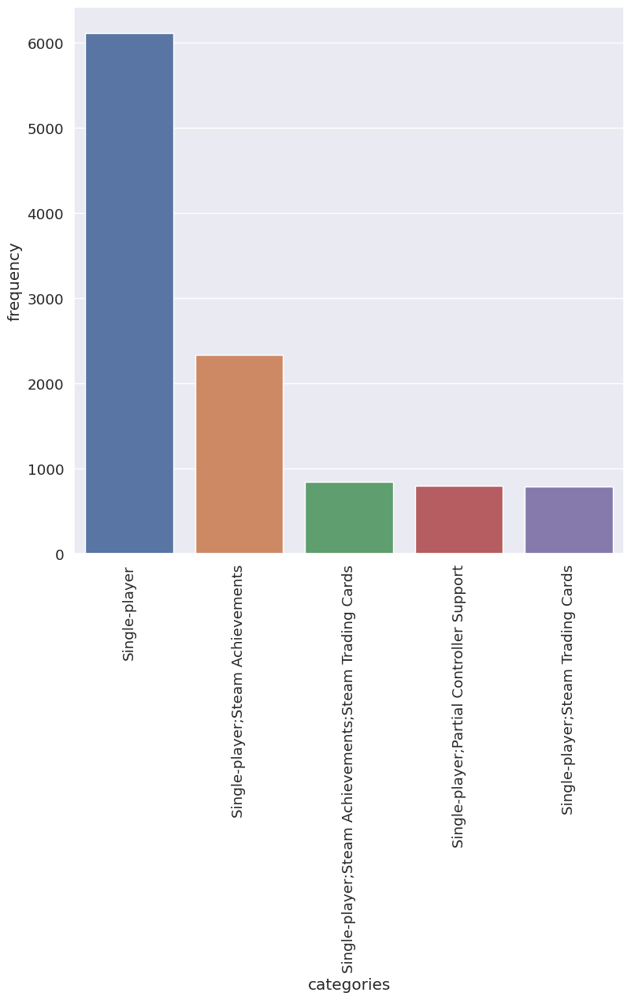

In [72]:
#seaborn
plt.xticks(rotation=90)
sns.barplot(data=df_eda["categories"].value_counts().head(5).reset_index(),
             x="index",
             y="categories")
plt.xlabel("categories")
plt.ylabel("frequency")


In [73]:
#ploty
fig=px.bar(data_frame=df_eda["categories"].value_counts().head(5).reset_index(),
        x="categories",
        y="index",
        labels={"categories":"frequency","index":"categories"},
        text_auto="0.2s")
fig.update_traces(textfont_size=12,textposition="outside")

<a id=section21></a>

# Bivariate

In [74]:
df_eda.columns

Index(['name', 'english', 'developer', 'publisher', 'required_age',
       'categories', 'genres', 'steamspy_tags', 'achievements',
       'positive_ratings', 'negative_ratings', 'average_playtime',
       'median_playtime', 'owners', 'price', 'year_of_released',
       'month_of_released', 'day_of_released', 'platforms_windows',
       'platforms_mac', 'platforms_linux'],
      dtype='object')

<a id=section22></a>

## What is the 5 most expensive games? (name/price)

In [75]:
#pandas
d=df_eda.sort_values(by="price",ascending=False).head(5)[["name","price"]]
d

,name,price
21105,ADR-Labelling Game,421.99
13062,GameMaker Studio 2 UWP,303.99
10034,Houdini Indie,209.99
14917,CrisisActionVR,154.99
25568,Bible Test,154.99


Text(0.5, 1.0, ' the 5 most expensive games')

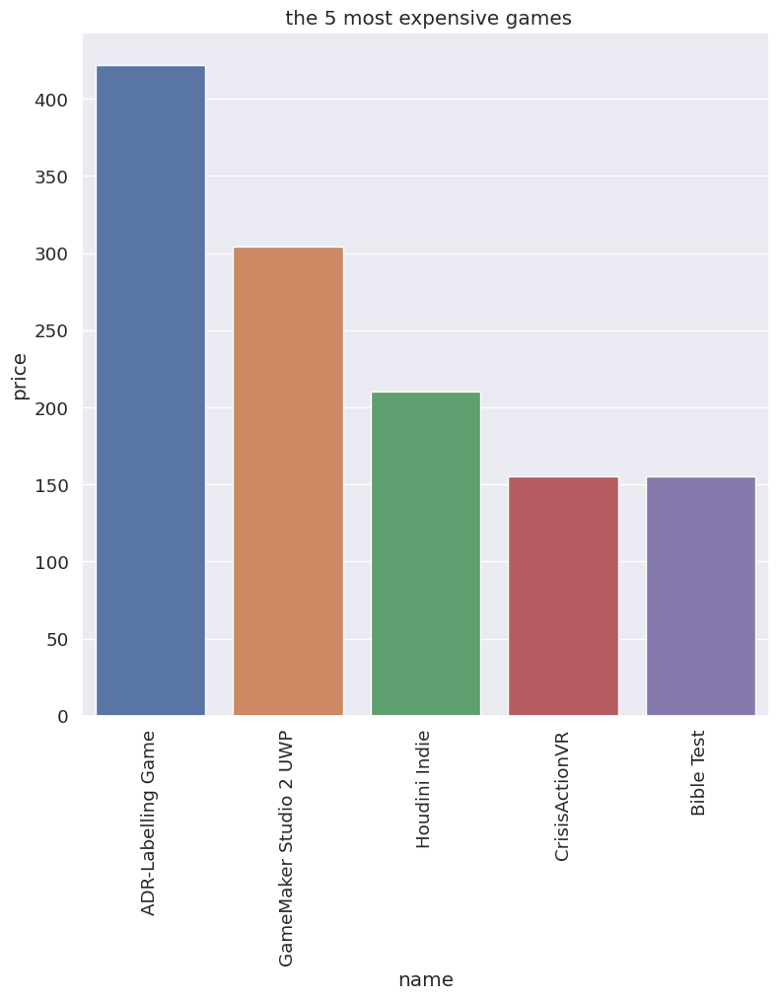

In [76]:
#seaborn
plt.xticks(rotation=90)
sns.barplot(data=d,
             x="name",
             y="price")
plt.xlabel("name")
plt.ylabel("price")
plt.title(" the 5 most expensive games")

In [77]:
#ploty
fig=px.bar(data_frame=d,
        x="price",
        y="name",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="the 5 most expensive games",title_x=0.5)

<a id=section23></a>

## What is average  price games  that are published for each years ?(year_of_released/price)

In [78]:
#pandas 
d=df_eda.groupby("year_of_released")["price"].mean().reset_index().round(2)
d

,year_of_released,price
0,1997,5.99
1,1998,7.19
2,1999,3.99
3,2000,5.59
4,2001,2.00
5,2002,7.99
6,2003,2.99
7,2004,5.76
8,2005,4.03
9,2006,7.56


Text(0.5, 1.0, ' Average  price games  that are published for each years')

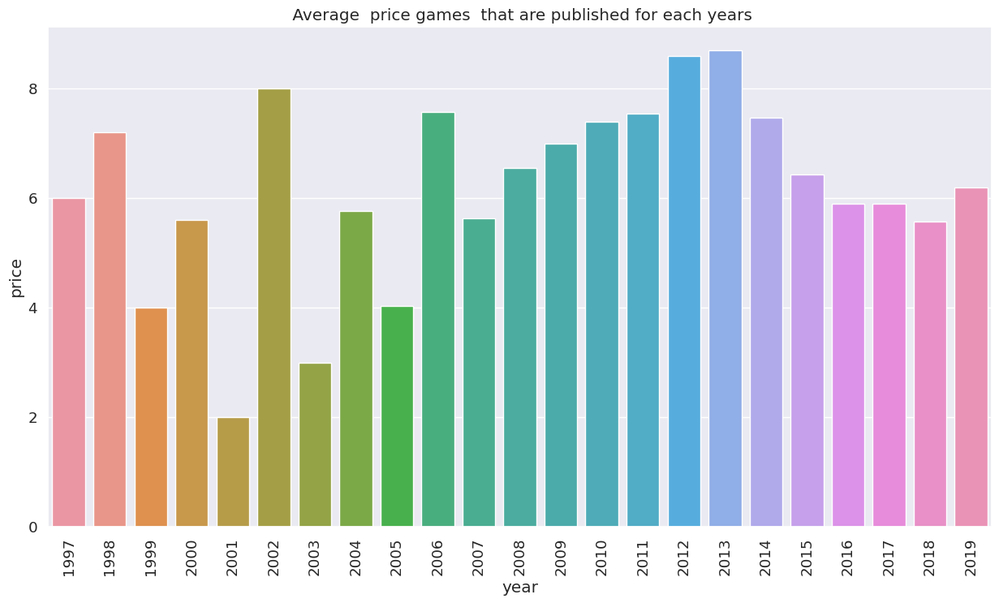

In [79]:
#seaborn
plt.figure(figsize=(15,8))
plt.xticks(rotation=90)
sns.barplot(data=d,
             x="year_of_released",
             y="price")
plt.xlabel("year")
plt.ylabel("price")
plt.title(" Average  price games  that are published for each years")

In [80]:
#ploty
fig=px.bar(data_frame=d,
        x="year_of_released",
        y="price",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="Average  price games  that are published for each years",title_x=0.5)

we note that in 2013 this is the year has a maximum average of price

<a id=section24></a>


## What is the average price games of windows? (platforms_windows /price)

In [81]:
#pandas
round(df_eda[df_eda["platforms_windows"]==1]["price"].mean(),2)

6.08

<a id=section25></a>


## What is the average price games of Mac? (platforms_mac /price)

In [82]:
#pandas
round(df_eda[df_eda["platforms_mac"]==1]["price"].mean(),2)

6.32

<a id=section26></a>


## What is the average price games of Linux? (platforms_linux /price)

In [83]:
#pandas
round(df_eda[df_eda["platforms_linux"]==1]["price"].mean(),2)

6.48

from last 3 question we note that the min average of all platforms is __Windows__
                                 and the max average of all platforms is __Linux__

<a id=section27></a>

## What is the 5 most developer for windows?(platforms_windows/developer)

In [84]:
#pandas
d=df_eda[df_eda["platforms_windows"]==1] #this data for windows

d2=d.groupby(["developer"]).agg({"developer":"count"}).rename(columns={"developer":"count"}).reset_index().sort_values(by="count",ascending=False).head(5)
d2

,developer,count
2624,Choice of Games,94
7485,"KOEI TECMO GAMES CO., LTD.",72
11853,Ripknot Systems,62
7988,Laush Dmitriy Sergeevich,51
9827,"Nikita ""Ghost_RUS""",50


Text(0.5, 1.0, ' The 5 most developer for windows')

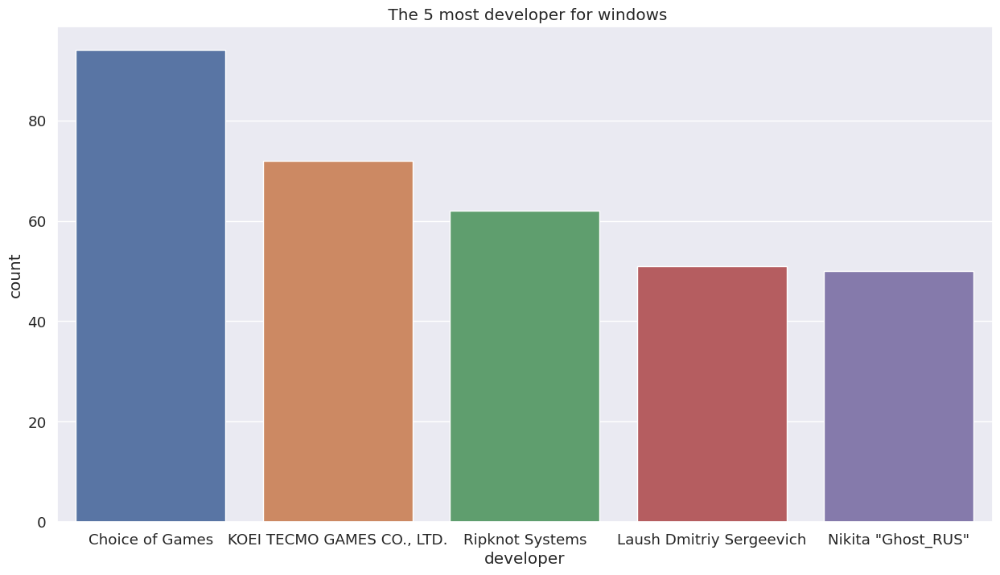

In [85]:
#seaborn
plt.figure(figsize=(15,8))

sns.barplot(data=d2,
             x="developer",
             y="count")
plt.xlabel("developer")
plt.ylabel("count")
plt.title(" The 5 most developer for windows")

In [86]:
#ploty
fig=px.bar(data_frame=d2,
        x="count",
        y="developer",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="The 5 most developer for windows",title_x=0.5)

In [87]:
#ploty
fig=px.pie(data_frame=d2,
           names="developer",
           values="count",
           hole=0.3)
fig.update_layout(title_text="The 5 most developer for windows",title_x=0.4)

<a id=section28></a>

## What is the 5 most developer for Mac?(platforms_mac/developer)

In [88]:
#pandas
d=df_eda[df_eda["platforms_mac"]==1] #this data for mac

d2=d.groupby(["developer"]).agg({"developer":"count"}).rename(columns={"developer":"count"}).reset_index().sort_values(by="count",ascending=False).head(5)
d2

,developer,count
818,Choice of Games,94
2052,Hosted Games,42
1612,For Kids,36
2071,Humongous Entertainment,33
2022,HexWar Games,27


Text(0.5, 1.0, ' The 5 most developer for mac')

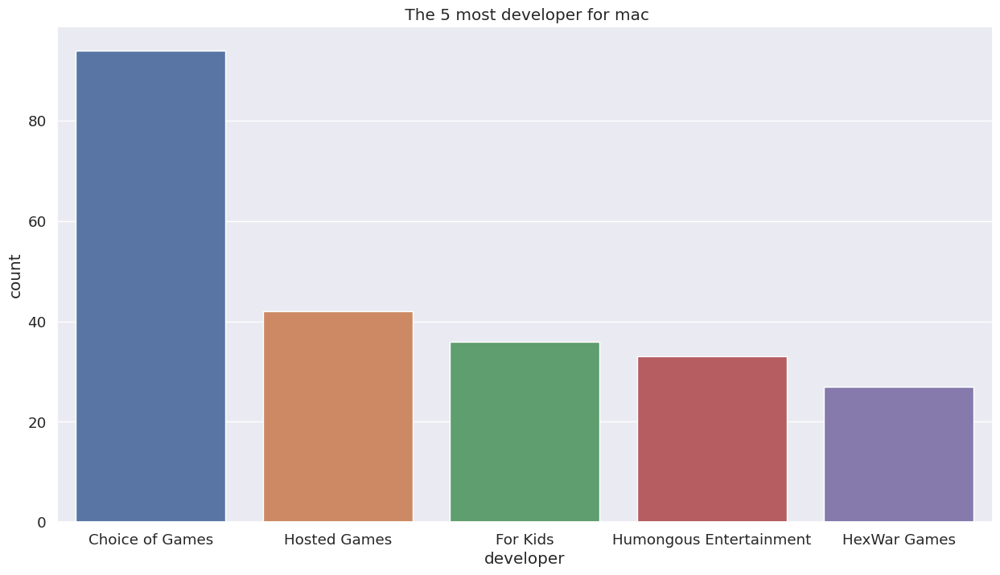

In [89]:
#seaborn
plt.figure(figsize=(15,8))

sns.barplot(data=d2,
             x="developer",
             y="count")
plt.xlabel("developer")
plt.ylabel("count")
plt.title(" The 5 most developer for mac")

In [90]:
#ploty
fig=px.bar(data_frame=d2,
        x="count",
        y="developer",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="The 5 most developer for mac",title_x=0.5)

In [91]:
#ploty
fig=px.pie(data_frame=d2,
           names="developer",
           values="count",
           hole=0.3)
fig.update_layout(title_text="The 5 most developer for mac",title_x=0.4)

<a id=section29></a>

## What is the 5 most developer for Linux?(platforms_linux/developer)

In [92]:
#pandas
d=df_eda[df_eda["platforms_linux"]==1] #this data for linux

d2=d.groupby(["developer"]).agg({"developer":"count"}).rename(columns={"developer":"count"}).reset_index().sort_values(by="count",ascending=False).head(5)
d2

,developer,count
441,Choice of Games,94
1147,Hosted Games,39
906,For Kids,36
1162,Humongous Entertainment,33
2332,Sly,26


Text(0.5, 1.0, ' The 5 most developer for linux')

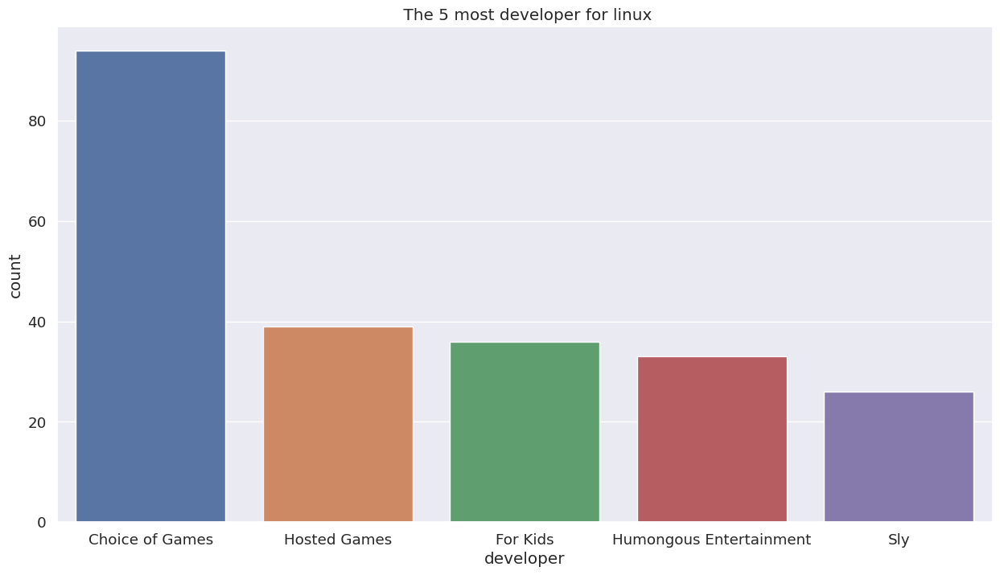

In [93]:
#seaborn
plt.figure(figsize=(15,8))

sns.barplot(data=d2,
             x="developer",
             y="count")
plt.xlabel("developer")
plt.ylabel("count")
plt.title(" The 5 most developer for linux")

In [94]:
#ploty
fig=px.bar(data_frame=d2,
        x="count",
        y="developer",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="The 5 most developer for linux",title_x=0.5)

In [95]:
#ploty
fig=px.pie(data_frame=d2,
           names="developer",
           values="count",
           hole=0.3)
fig.update_layout(title_text="The 5 most developer for linux",title_x=0.4)

 - we note that for last 3 questions ; __Choice of Games company__ is __the top__ developer company for all platforms and most developer company for mac and linux is __same__

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section30></a>

## What is the 5 most developer which have positive ratings?(developer/positive_ratings)

In [96]:
#pandas
d=df_eda.groupby("developer")["positive_ratings"].mean().sort_values(ascending=False).head(5).reset_index()
d

,developer,positive_ratings
0,Valve;Hidden Path Entertainment,2644404.0
1,PUBG Corporation,496184.0
2,OVERKILL - a Starbreeze Studio.,308657.0
3,Smartly Dressed Games,292574.0
4,Re-Logic,255600.0


Text(0.5, 1.0, ' The 5 most developer which have positive ratings')

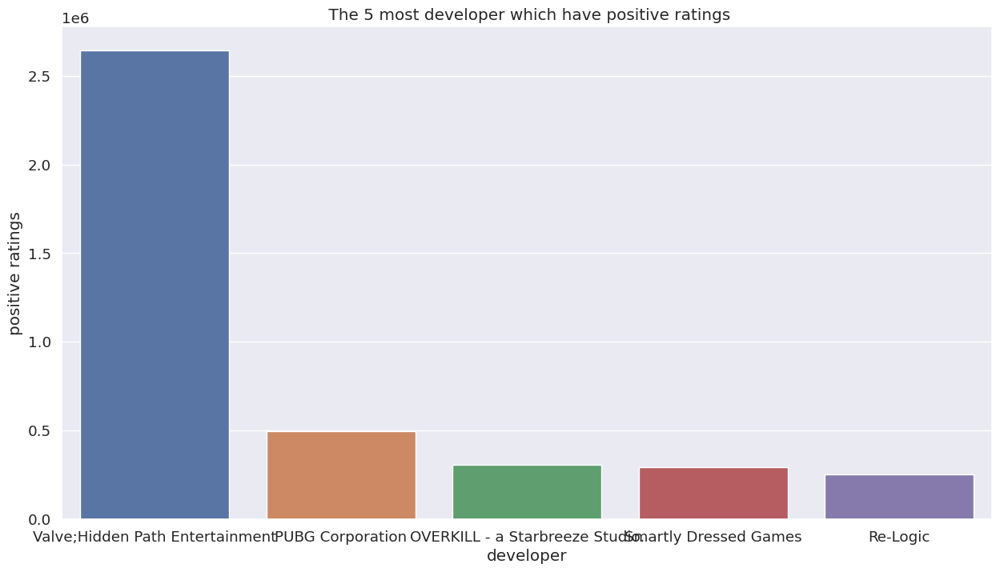

In [97]:
#seaborn
plt.figure(figsize=(15,8))

sns.barplot(data=d,
             x="developer",
             y="positive_ratings")
plt.xlabel("developer")
plt.ylabel("positive ratings")
plt.title(" The 5 most developer which have positive ratings")

In [98]:
#ploty
fig=px.bar(data_frame=d,
        x="positive_ratings",
        y="developer",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="The 5 most developer which have positive ratings",title_x=0.5)

we note that the top developer company have positive ratings is __Valve company, Hiddenc ompany and Path Entertainment company__

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section31></a>

## What is the 5 most developer which have negative ratings ?(developer/negative_ratings)

In [99]:
#pandas
d=df_eda.groupby("developer")["negative_ratings"].mean().sort_values(ascending=False).head(5).reset_index()
d

,developer,negative_ratings
0,PUBG Corporation,487076.0
1,Valve;Hidden Path Entertainment,402313.0
2,NantG,91664.0
3,Studio Wildcard;Instinct Games;Efecto Studios;...,66603.0
4,OVERKILL - a Starbreeze Studio.,56523.0


Text(0.5, 1.0, ' The 5 most developer which have negative ratings')

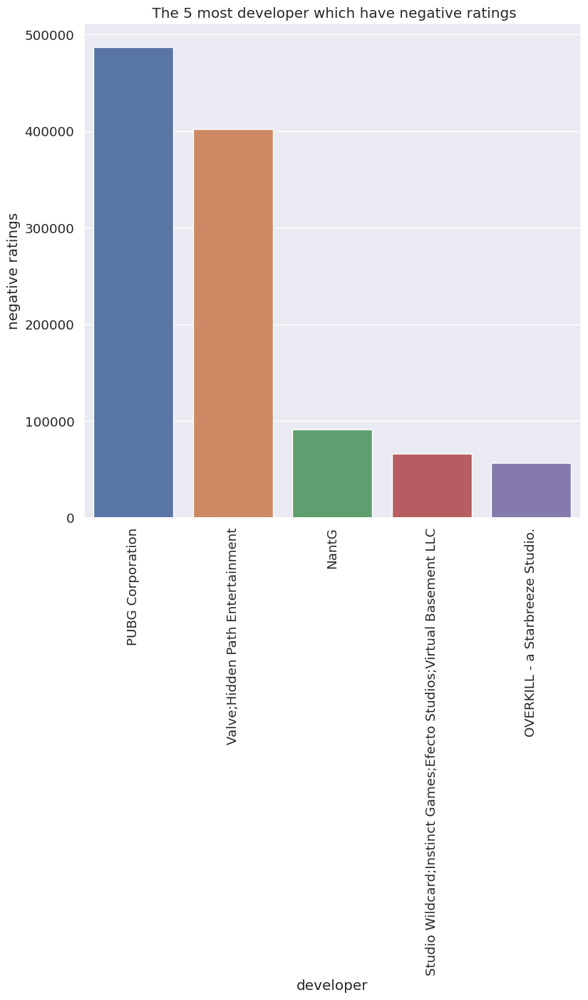

In [100]:
#seaborn

plt.xticks(rotation=90)
sns.barplot(data=d,
             x="developer",
             y="negative_ratings")
plt.xlabel("developer")
plt.ylabel("negative ratings")
plt.title(" The 5 most developer which have negative ratings")

In [101]:
#ploty
fig=px.bar(data_frame=d,
        x="negative_ratings",
        y="developer",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="The 5 most developer which have negative ratings",title_x=0.5)

we note that top developer company have negative ratings is __PUBG Corporation__ , and __Valve company and Hidden Path Entertainment company__ aslo is in top 5 company have negative ratings ,Although they are in top 5 company have __positive ratings__

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section32></a>

## What is the 5 highest genres have average play time?(genres/average_playtime)

In [102]:
#pandas
d=df_eda.groupby("genres")["average_playtime"].mean().sort_values(ascending=False).head(5).reset_index()
d

,genres,average_playtime
0,Massively Multiplayer;RPG,19778.000
1,Free to Play;Indie;RPG;Strategy,12020.625
2,Action;Adventure;Free to Play;Indie;Strategy;E...,8508.000
3,Free to Play;Indie;Simulation;Sports,8180.000
4,Action;Adventure;Massively Multiplayer;RPG;Sim...,8161.000


Text(0.5, 1.0, ' The 5 highest genres have average play time')

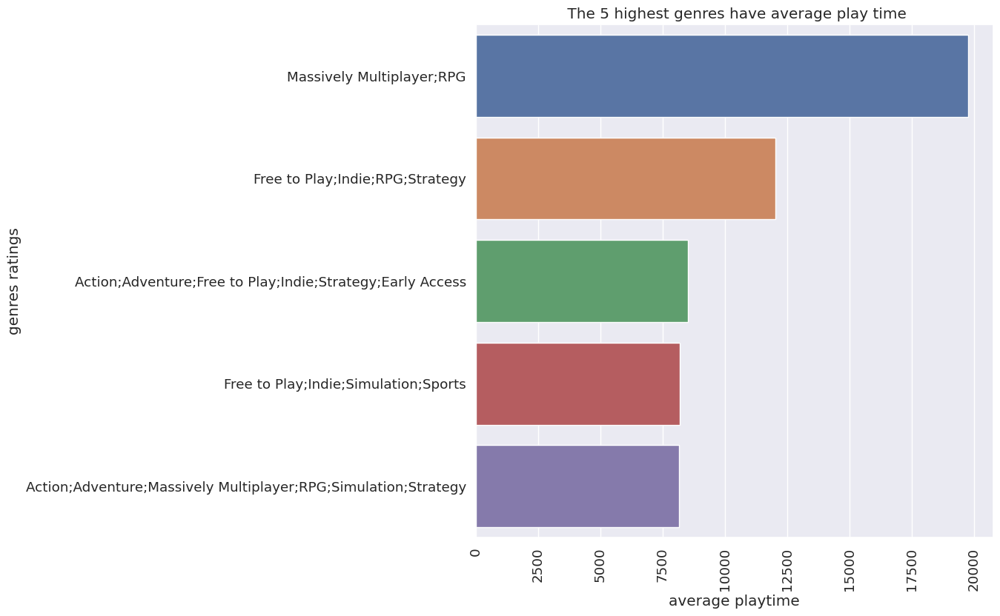

In [103]:
#seaborn

plt.xticks(rotation=90)
sns.barplot(data=d,
             x="average_playtime",
             y="genres")
plt.xlabel("average playtime")
plt.ylabel("genres ratings")
plt.title(" The 5 highest genres have average play time")

In [104]:
#ploty
fig=px.bar(data_frame=d,
        x="average_playtime",
        y="genres",
        text_auto="0.2s",
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="The 5 highest genres have average play time",title_x=0.5)

In [105]:
d

,genres,average_playtime
0,Massively Multiplayer;RPG,19778.000
1,Free to Play;Indie;RPG;Strategy,12020.625
2,Action;Adventure;Free to Play;Indie;Strategy;E...,8508.000
3,Free to Play;Indie;Simulation;Sports,8180.000
4,Action;Adventure;Massively Multiplayer;RPG;Sim...,8161.000


- we note that any games is __[Free to Play / Indie / Massively Multiplayer / Action / Adventure]__ have largest average_playtime

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section33></a>

## What is the 5 lowerest genres have average play time?(genres/average_playtime)

In [106]:
#pandas
d=df_eda.groupby("genres")["average_playtime"].mean().sort_values(ascending=True).head(5).reset_index()
d

,genres,average_playtime
0,Accounting;Animation & Modeling;Audio Producti...,0.0
1,Gore;Adventure;Casual;Free to Play;Indie,0.0
2,Gore;Action;Indie;Strategy,0.0
3,Gore;Action;Indie;Racing;Early Access,0.0
4,Gore;Action;Indie;RPG,0.0


- we note that almost games is __[Gore]__ have lowest average_playtime

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section34></a>

# Multivariate

<a id=section35></a>

## What is the 5 most expensive develpoer for windows ? (platforms_windows/ developer /price)

In [107]:
#pandas 
d=df_eda[df_eda["platforms_windows"]==1] #to select all platforms of windows
data1=d.groupby("developer")["price"].mean().sort_values(ascending=False).head(5).reset_index()
data1

,developer,price
0,Suomen Kuljetusturva Oy,421.99
1,SideFX,209.99
2,YoYo Games Ltd.,162.49
3,Capt McCay Soft,154.99
4,Capt. McCay Soft,154.99


Text(0.5, 1.0, ' What is the 5 most expensive develpoer for windows')

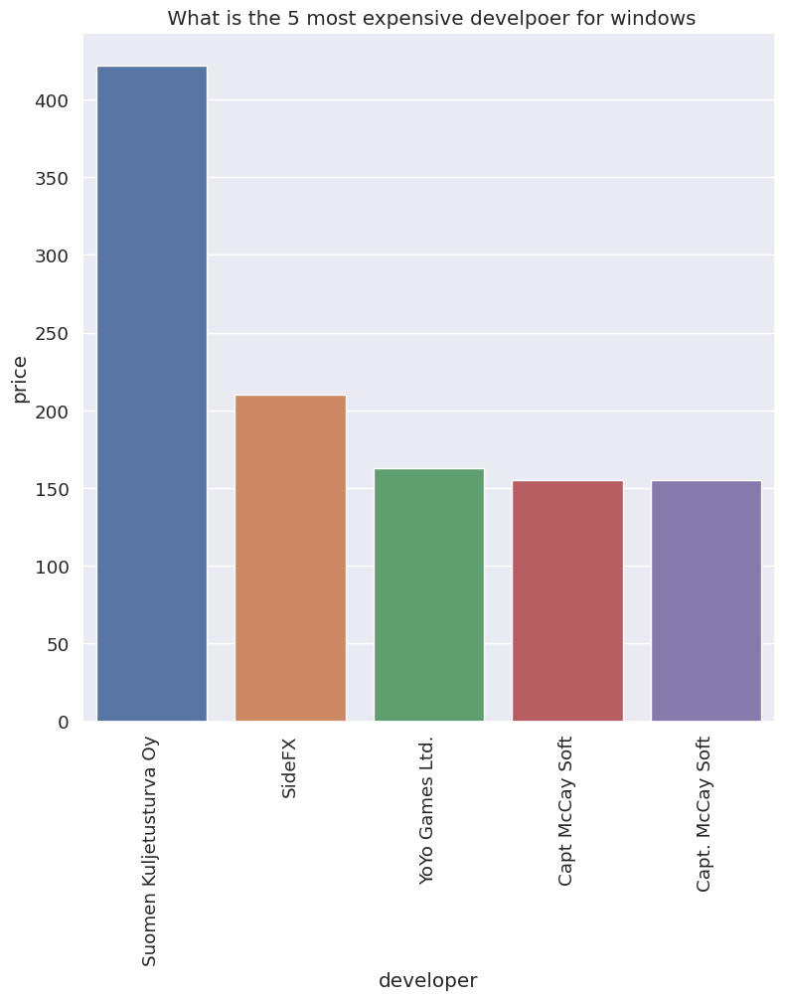

In [108]:
#seaborn

plt.xticks(rotation=90)
sns.barplot(data=data1,
             x="developer",
             y="price")
plt.xlabel("developer")
plt.ylabel("price")
plt.title(" What is the 5 most expensive develpoer for windows")

In [109]:
#ploty
fig1=px.bar(data_frame=data1,
        x="price",
        y="developer",
        text_auto="0.2s",
        )
fig1.update_traces(textfont_size=12,textposition="outside")
fig1.update_layout(title_text=" What is the 5 most expensive develpoer for windows",title_x=0.5)

- we note that top delelpoer companies have expensive games for platform windows are __[Suomen Kuljetusturva Oy , SideFX ,YoYo Games Ltd ,Capt McCay Soft]__.

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section36></a>

## What is the 5 most expensive develpoer for mac? (platforms_mac /developer /price)

In [110]:
#pandas 
d=df_eda[df_eda["platforms_mac"]==1] #to select all platforms of mac
data2=d.groupby("developer")["price"].mean().sort_values(ascending=False).head(5).reset_index()
data2

,developer,price
0,YoYo Games Ltd.,162.49
1,Capt. McCay Soft,154.99
2,Capt McCay Soft,154.99
3,Matt Workman,69.99
4,The Game Creators,60.99


Text(0.5, 1.0, ' What is the 5 most expensive develpoer for mac')

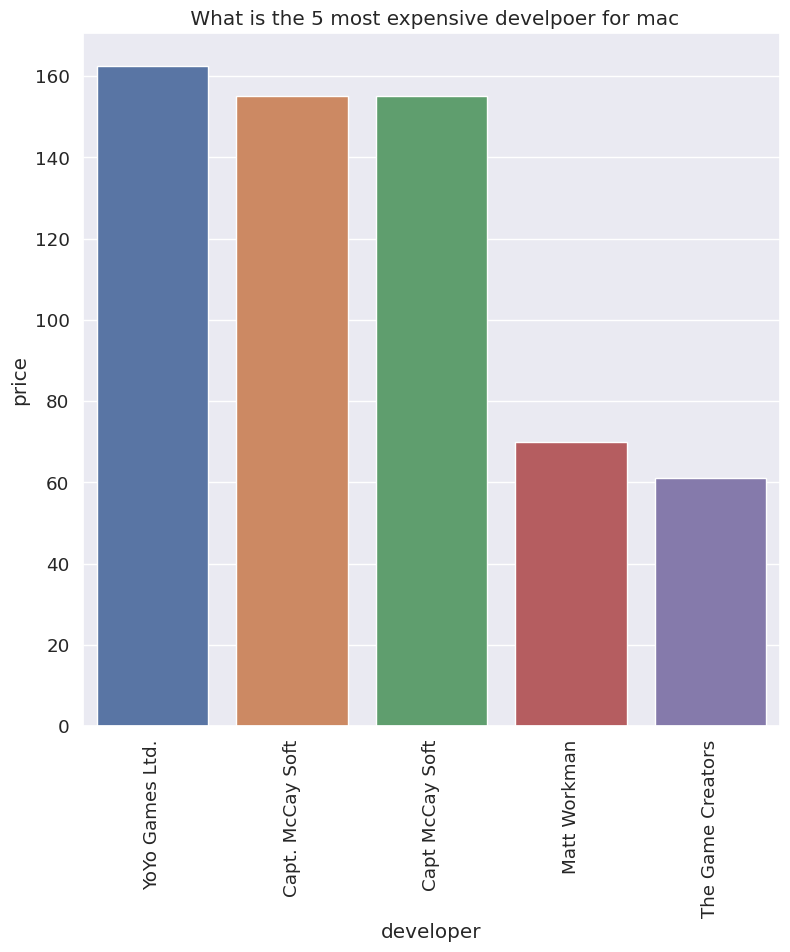

In [111]:
#seaborn

plt.xticks(rotation=90)
sns.barplot(data=data2,
             x="developer",
             y="price")
plt.xlabel("developer")
plt.ylabel("price")
plt.title(" What is the 5 most expensive develpoer for mac")

In [112]:
#ploty
fig2=px.bar(data_frame=data2,
        x="price",
        y="developer",
        text_auto="0.2s",
        )
fig2.update_traces(textfont_size=12,textposition="outside")
fig2.update_layout(title_text=" What is the 5 most expensive develpoer for mac",title_x=0.5)

- we note that top developer companies have expensive games for platform mac are __[YoYo Games Ltd , Capt. McCay Soft ,Matt Workman ,The Game Creators	]__.

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section37></a>

## What is the 5 most expensive develpoer for linux ?(platforms_linux/developer/price)

In [113]:
#pandas 
d=df_eda[df_eda["platforms_linux"]==1]
data3=d.groupby("developer")["price"].mean().sort_values(ascending=False).head(5).reset_index()
data3

,developer,price
0,The Game Creators,60.99
1,Wingware,60.99
2,KADOKAWA;Yoji Ojima,60.99
3,Laminar Research,54.99
4,BrashMonkey,44.99


Text(0.5, 1.0, ' What is the 5 most expensive develpoer for linux')

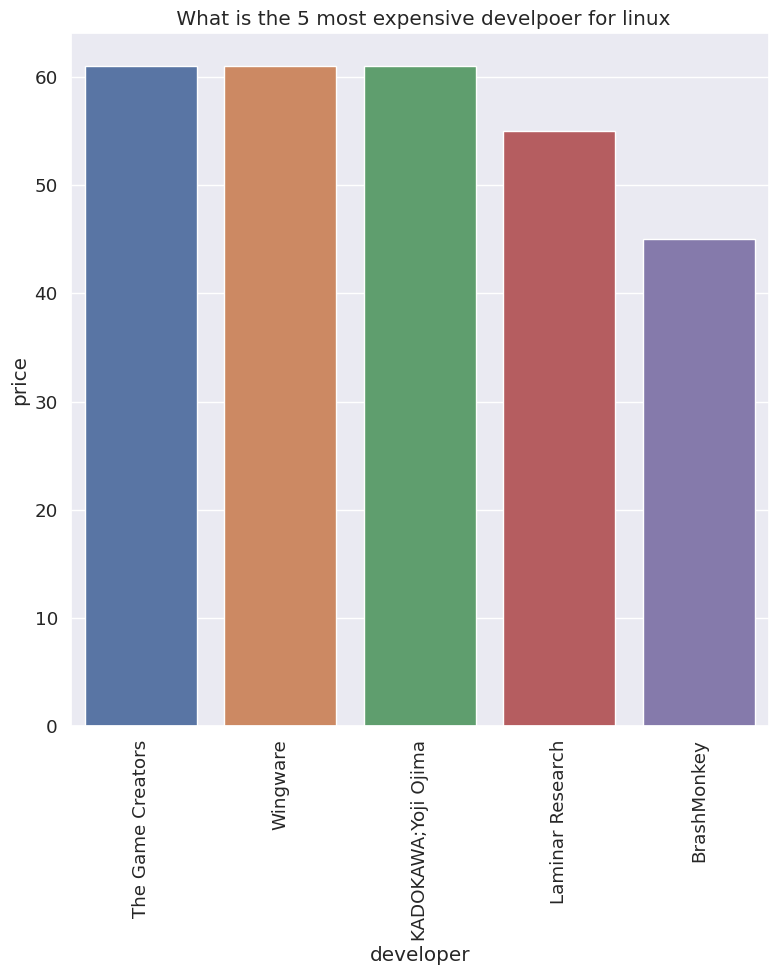

In [114]:
#seaborn

plt.xticks(rotation=90)
sns.barplot(data=data3,
             x="developer",
             y="price")
plt.xlabel("developer")
plt.ylabel("price")
plt.title(" What is the 5 most expensive develpoer for linux")

In [115]:
#ploty
fig3=px.bar(data_frame=data3,
        x="price",
        y="developer",
        text_auto="0.2s",
        )
fig3.update_traces(textfont_size=12,textposition="outside")
fig3.update_layout(title_text=" What is the 5 most expensive develpoer for linux",title_x=0.5)

- we note that top developer companies have expensive games for platform linux are __[The Game Creators , Wingware , KADOKAWA , Yoji Ojima , Laminar Research	 , BrashMonkey]__.

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section38></a>

## What is the average price of reach year if english or not ? (year_of_released / english / price )

In [116]:
#pandas
d=df_eda.groupby(["year_of_released","english"])["price"].mean().reset_index().round(2)
d

,year_of_released,english,price
0,1997,1,5.99
1,1998,1,7.19
2,1999,1,3.99
3,2000,1,5.59
4,2001,1,2.00
5,2002,1,7.99
6,2003,1,2.99
7,2004,1,5.76
8,2005,1,4.03
9,2006,1,7.56


Text(0.5, 1.0, ' what is the average orice of reach year if english or not ')

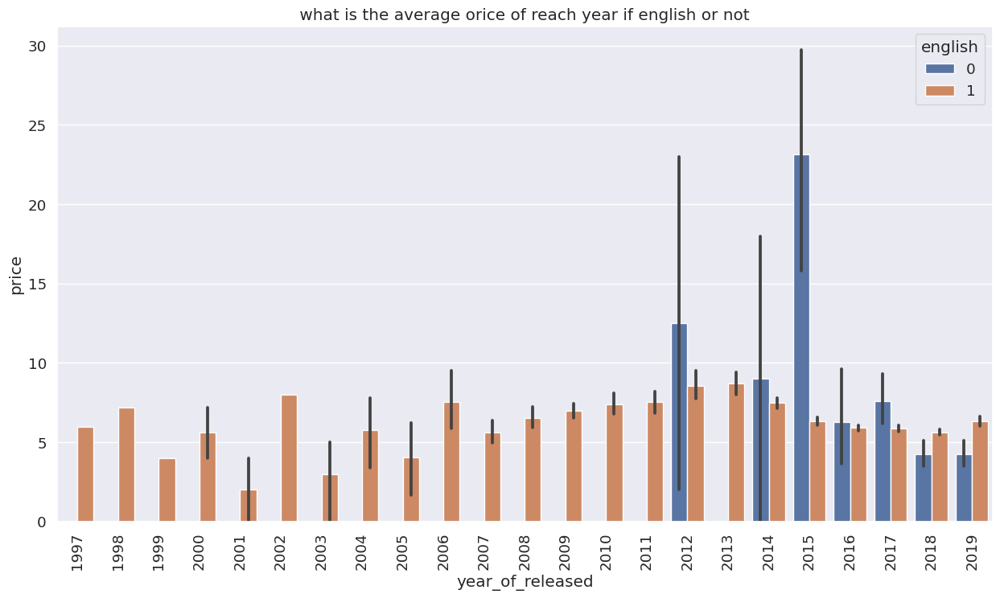

In [117]:
#seaborn
plt.figure(figsize=(15,8))
plt.xticks(rotation=90)
sns.barplot(data=df_eda,
             x="year_of_released",
             y="price",
           hue="english")
plt.xlabel("year_of_released")
plt.ylabel("price")
plt.title(" what is the average orice of reach year if english or not ")

In [118]:
#ploty
fig=px.bar(data_frame=d,
        x="year_of_released",
        y="price",
        text_auto="0.2s",
        color="english"
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text=" What is the average price of reach year if english or not ?",title_x=0.5)

- we note that max average price if games are not engish were __2015__ and min average price if games are not engish were __2019__


- we note that max average price if games are yes engish were __2013__ and min average price if games are not engish were __2001__


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section39></a>

## What is the average playtime for required age to platform's windows ?(platforms_window s/ required_age / average_playtime)

In [119]:
#pandas
d=df_eda[df_eda["platforms_windows"]==1]
d

,name,english,developer,publisher,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,Counter-Strike,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,...,17612,317,10000000-20000000,7.19,2000,11,1,1,1,1
1,Team Fortress Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,...,277,62,5000000-10000000,3.99,1999,4,1,1,1,1
2,Day of Defeat,1,Valve,Valve,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,...,187,34,5000000-10000000,3.99,2003,5,1,1,1,1
3,Deathmatch Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,...,258,184,5000000-10000000,3.99,2001,6,1,1,1,1
4,Half-Life: Opposing Force,1,Gearbox Software,Valve,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,...,624,415,5000000-10000000,3.99,1999,11,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27070,Room of Pandora,1,SHEN JIAWEI,SHEN JIAWEI,0,Single-player;Steam Achievements,Adventure;Casual;Indie,Adventure;Indie;Casual,7,3,...,0,0,0-20000,2.09,2019,4,24,1,0,0
27071,Cyber Gun,1,Semyon Maximov,BekkerDev Studio,0,Single-player,Action;Adventure;Indie,Action;Indie;Adventure,0,8,...,0,0,0-20000,1.69,2019,4,23,1,0,0
27072,Super Star Blast,1,EntwicklerX,EntwicklerX,0,Single-player;Multi-player;Co-op;Shared/Split ...,Action;Casual;Indie,Action;Indie;Casual,24,0,...,0,0,0-20000,3.99,2019,4,24,1,0,0
27073,New Yankee 7: Deer Hunters,1,Yustas Game Studio,Alawar Entertainment,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,2,...,0,0,0-20000,5.19,2019,4,17,1,1,0


In [120]:
data=d.groupby("required_age")["average_playtime"].mean().round(2).reset_index()
data

,required_age,average_playtime
0,0,140.76
1,3,169.18
2,7,60.50
3,12,226.30
4,16,668.31
5,18,594.47


Text(0.5, 1.0, " what is the average playtime for required age to platform's windows")

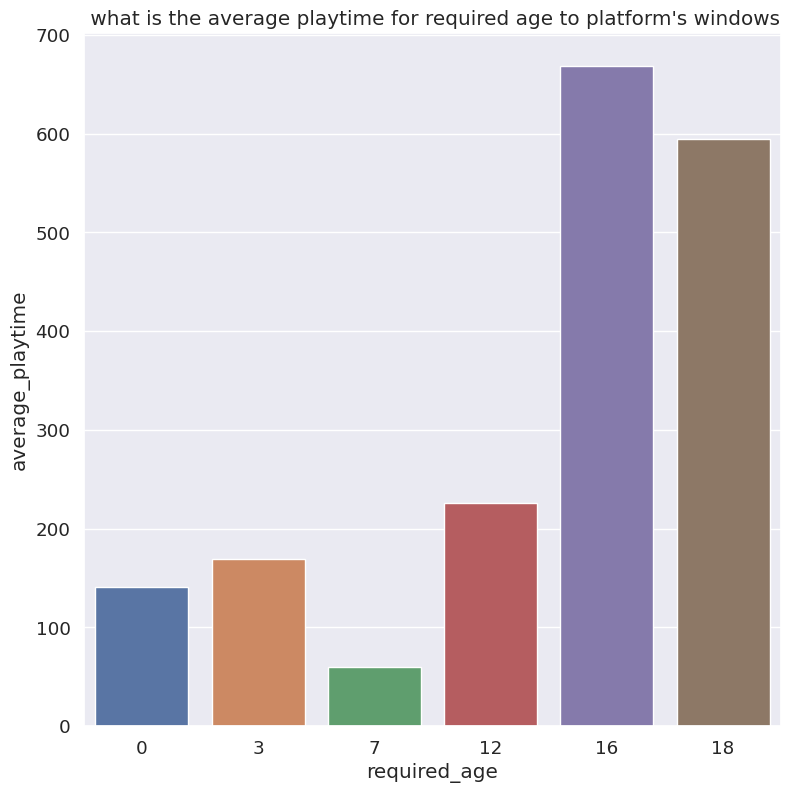

In [121]:
#seaborn

sns.barplot(data=data,
             x="required_age",
             y="average_playtime")
plt.xlabel("required_age")
plt.ylabel("average_playtime")
plt.title(" what is the average playtime for required age to platform's windows")

In [122]:
#ploty
fig=px.pie(data_frame=data,
           names="required_age",
           values="average_playtime",
           hole=0.2)
fig.update_layout(title_text="what is the average playtime for required age to platform's windows",title_x=0.4)

In [123]:
#ploty
fig3=px.bar(data_frame=data,
        x="required_age",
        y="average_playtime",
        text_auto="0.2s",
        )
fig3.update_traces(textfont_size=12,textposition="outside")
fig3.update_layout(title_text="what is the average playtime for required age to platform's windows",title_x=0.5)

- we note that some how  in windows almost games which required age in __16 age__ have max average play time and required age in __7 age__ have min average play time 

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section40></a>

## What is the average playtime for required age to platform's mac ?(platforms_mac / required_age / average_playtime)

In [124]:
#pandas
d=df_eda[df_eda["platforms_mac"]==1]
d

,name,english,developer,publisher,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,Counter-Strike,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,...,17612,317,10000000-20000000,7.19,2000,11,1,1,1,1
1,Team Fortress Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,...,277,62,5000000-10000000,3.99,1999,4,1,1,1,1
2,Day of Defeat,1,Valve,Valve,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,...,187,34,5000000-10000000,3.99,2003,5,1,1,1,1
3,Deathmatch Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,...,258,184,5000000-10000000,3.99,2001,6,1,1,1,1
4,Half-Life: Opposing Force,1,Gearbox Software,Valve,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,...,624,415,5000000-10000000,3.99,1999,11,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27019,Argonauts Agency: Pandora's Box,1,Workroom7,Workroom7,0,Single-player;Steam Achievements;Steam Cloud,Casual;Simulation;Strategy,Strategy;Casual;Simulation,29,1,...,0,0,0-20000,4.79,2019,4,17,1,1,0
27035,Funny Bunny: Adventures,1,mPower Games Studio,mPower Games Studio,0,Single-player;Steam Achievements,Action;Adventure;Casual;Indie,Casual;Adventure;Arcade,22,3,...,0,0,0-20000,7.19,2019,4,24,1,1,1
27049,New Yankee 6: In Pharaoh's Court,1,Yustas Game Studio,Alawar Entertainment,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,2,...,0,0,0-20000,5.19,2019,4,3,1,1,0
27073,New Yankee 7: Deer Hunters,1,Yustas Game Studio,Alawar Entertainment,0,Single-player;Steam Cloud,Adventure;Casual;Indie,Indie;Casual;Adventure,0,2,...,0,0,0-20000,5.19,2019,4,17,1,1,0


In [125]:
data=d.groupby("required_age")["average_playtime"].mean().round(2).reset_index()
data

,required_age,average_playtime
0,0,223.27
1,3,102.20
2,7,0.00
3,12,160.92
4,16,349.75
5,18,745.30


Text(0.5, 1.0, " what is the average playtime for required age to platform's windows")

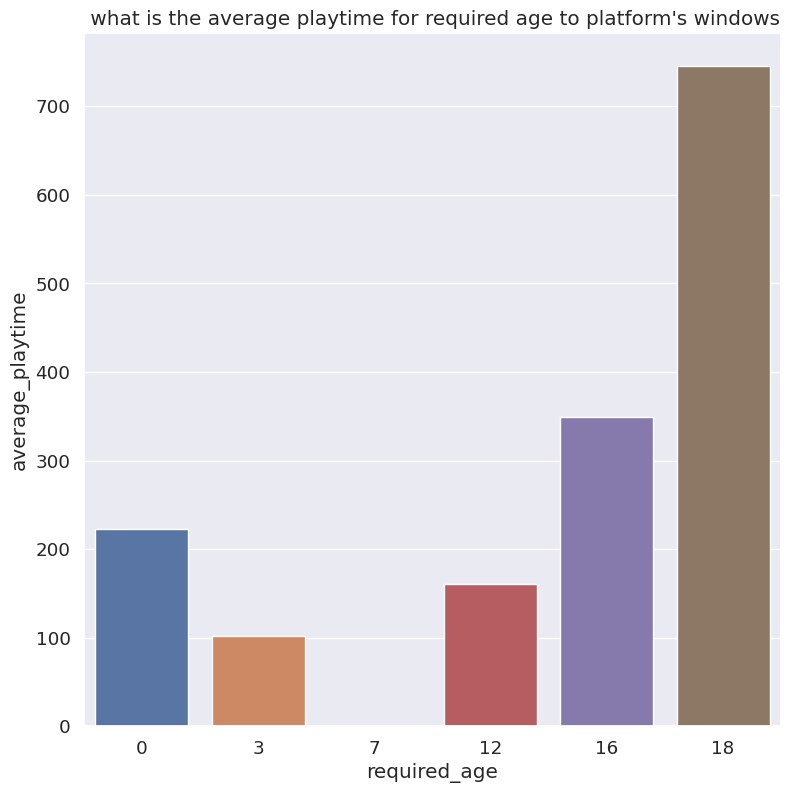

In [126]:
#seaborn

sns.barplot(data=data,
             x="required_age",
             y="average_playtime")
plt.xlabel("required_age")
plt.ylabel("average_playtime")
plt.title(" what is the average playtime for required age to platform's windows")

In [127]:
#ploty
fig=px.pie(data_frame=data,
           names="required_age",
           values="average_playtime",
           hole=0.2)
fig.update_layout(title_text="what is the average playtime for required age to platform's mac",title_x=0.4)

In [128]:
#ploty
fig3=px.bar(data_frame=data,
        x="required_age",
        y="average_playtime",
        text_auto="0.2s",
        )
fig3.update_traces(textfont_size=12,textposition="outside")
fig3.update_layout(title_text="what is the average playtime for required age to platform's mac",title_x=0.5)

- we note that some how  in mac almost games which required age in __18 age__ have max average play time and required age in __7 age__ have min average play time 

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<a id=section41></a>

## What is the average playtime for required age to platform's linux ?(platforms_linux / required_age / average_playtime)

In [129]:
#pandas
d=df_eda[df_eda["platforms_linux"]==1]
d

,name,english,developer,publisher,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,...,average_playtime,median_playtime,owners,price,year_of_released,month_of_released,day_of_released,platforms_windows,platforms_mac,platforms_linux
0,Counter-Strike,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,...,17612,317,10000000-20000000,7.19,2000,11,1,1,1,1
1,Team Fortress Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,...,277,62,5000000-10000000,3.99,1999,4,1,1,1,1
2,Day of Defeat,1,Valve,Valve,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,...,187,34,5000000-10000000,3.99,2003,5,1,1,1,1
3,Deathmatch Classic,1,Valve,Valve,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,...,258,184,5000000-10000000,3.99,2001,6,1,1,1,1
4,Half-Life: Opposing Force,1,Gearbox Software,Valve,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,...,624,415,5000000-10000000,3.99,1999,11,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26933,In the Pause Between the Ringing,1,Studio Oleomingus,The Irregular Corporation,0,Single-player;Partial Controller Support,Adventure;Casual;Free to Play;Indie,Free to Play;Adventure;Indie,0,6,...,0,0,0-20000,0.00,2019,4,23,1,1,1
26959,The Superlatives: Shattered Worlds,1,Choice of Games,Choice of Games,0,Single-player;Steam Achievements;Captions avai...,Adventure;Indie;RPG,Adventure;Indie;RPG,17,2,...,0,0,0-20000,4.79,2019,3,28,1,1,1
26980,Heidentum,1,Kirchesch,Kirchesch,0,Single-player;Multi-player;Online Multi-Player...,Indie;Strategy,Strategy;Indie,16,0,...,0,0,0-20000,4.79,2019,4,11,1,1,1
26983,Adecke - Cards Games Deluxe,1,Philippe Pelchat,Philippe Pelchat,12,Single-player,Casual,Casual,0,3,...,0,0,0-20000,7.19,2019,4,20,1,1,1


In [130]:
data=d.groupby("required_age")["average_playtime"].mean().round(2).reset_index()
data

,required_age,average_playtime
0,0,258.69
1,3,240.00
2,7,0.00
3,12,315.00
4,16,482.55
5,18,479.24


Text(0.5, 1.0, " what is the average playtime for required age to platform's linux")

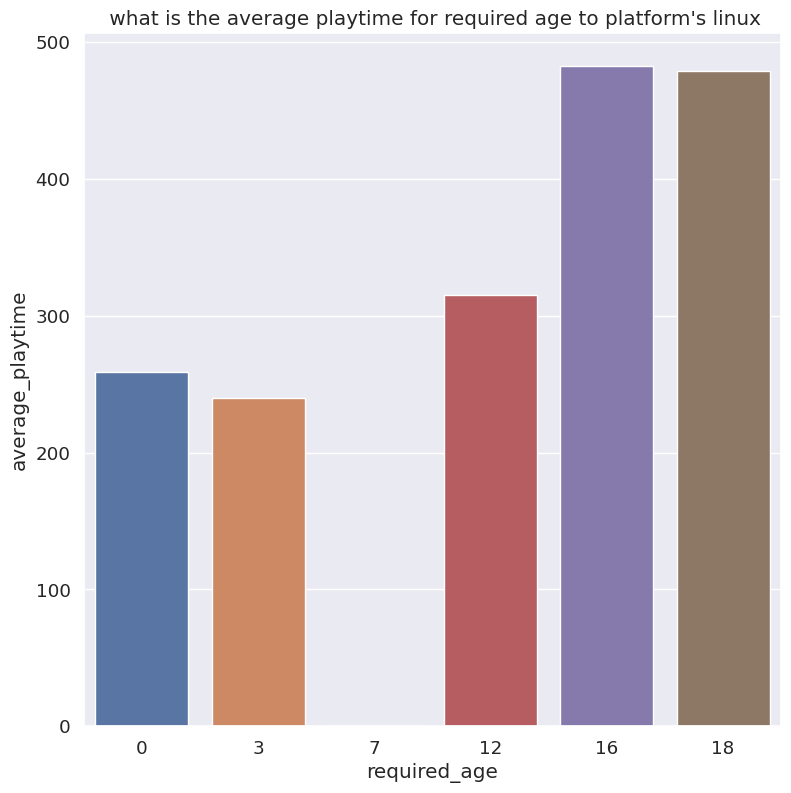

In [131]:
#seaborn

sns.barplot(data=data,
             x="required_age",
             y="average_playtime")
plt.xlabel("required_age")
plt.ylabel("average_playtime")
plt.title(" what is the average playtime for required age to platform's linux")

In [132]:
#ploty
fig=px.pie(data_frame=data,
           names="required_age",
           values="average_playtime",
           hole=0.2)
fig.update_layout(title_text="what is the average playtime for required age to platform's linux",title_x=0.4)

In [133]:
#ploty
fig3=px.bar(data_frame=data,
        x="required_age",
        y="average_playtime",
        text_auto="0.2s",
        )
fig3.update_traces(textfont_size=12,textposition="outside")
fig3.update_layout(title_text="what is the average playtime for required age to platform's windows",title_x=0.5)

- we note that some how  in mac almost games which required age in __18 age and 16 age__ have max average play time and required age in __7 age__ have min average play time 

- we conclude from last 3 question that almost activity aged are 18 age and 16 age and who have 7 age not activated

- I suggest that if any company need to success or increase profits it should care who has 16 or 18 age and publish games suitable for ages from 7

---------------

<a id=section42></a>

## What is the top 10 developer have positive ratings and what is it genres ? (developer / genres /positive_ratings)

In [134]:
#pandas
data=df_eda.groupby(['developer','genres'])["positive_ratings"].sum().sort_values(ascending=False).reset_index().head(10)
data

,developer,genres,positive_ratings
0,Valve;Hidden Path Entertainment,Action;Free to Play,2644404
1,Valve,Action;Free to Play;Strategy,863507
2,Valve,Action,707923
3,Valve,Action;Free to Play,515879
4,PUBG Corporation,Action;Adventure;Massively Multiplayer,496184
5,Bethesda Game Studios,RPG,448841
6,Facepunch Studios,Indie;Simulation,363721
7,Rockstar North,Action;Adventure,329061
8,OVERKILL - a Starbreeze Studio.,Action;RPG,308657
9,Smartly Dressed Games,Action;Adventure;Casual;Free to Play;Indie,292574


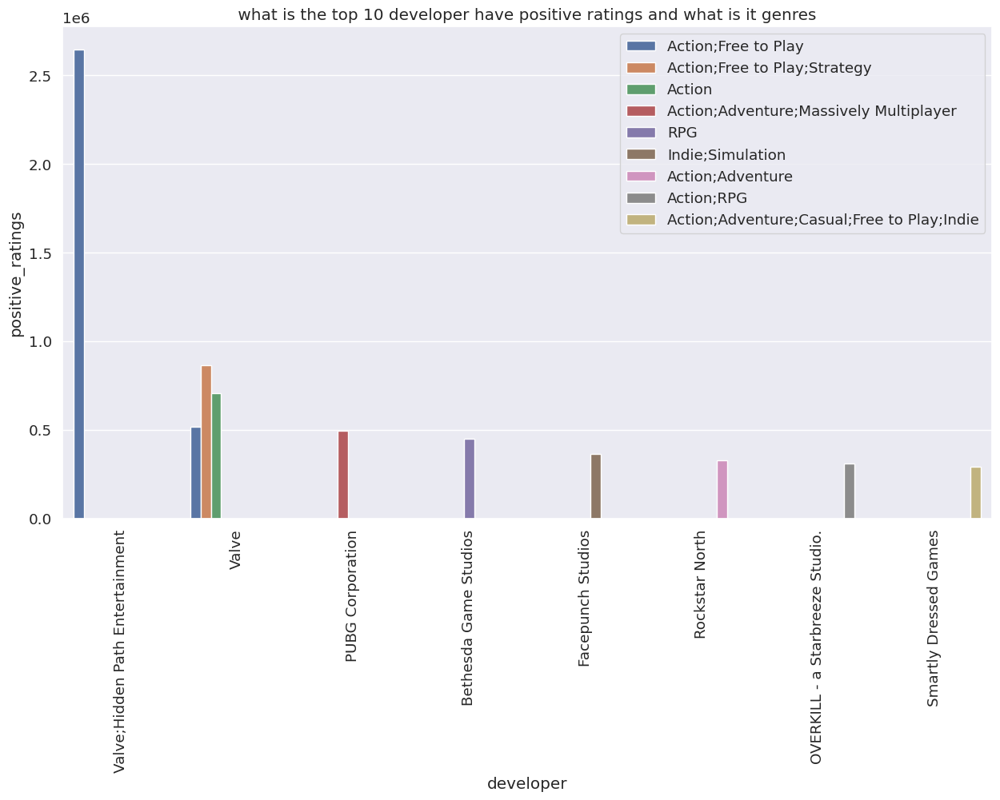

In [135]:
#seaborn
plt.figure(figsize=(15,8))
plt.xticks(rotation=90)
sns.barplot(data=data,
             x="developer",
             y="positive_ratings",
           hue="genres")
plt.xlabel("developer")
plt.ylabel("positive_ratings")
plt.title(" what is the top 10 developer have positive ratings and what is it genres ")
plt.legend(loc='upper right')

In [136]:
#ploty
fig=px.bar(data_frame=data,
        x="developer",
        y="positive_ratings",
        text_auto="0.2s",
        color="genres"
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="what is the top 10 developer have positive ratings and what is it genres",title_x=0.5)

- We note that most genres have the highest positive ratings __[Action/ Free to Play / RPG ]__ from developer compaies like __[Valve / Hidden Path Entertainment / PUBG Corporation	]__

---------------

<a id=section43></a>

## What is the top 10 developer have negative ratings and what is it genres?(developer / genres / negative_ratings)

In [137]:
#pandas
data=df_eda.groupby(['developer','genres'])["negative_ratings"].sum().sort_values(ascending=False).reset_index().head(10)
data

,developer,genres,negative_ratings
0,PUBG Corporation,Action;Adventure;Massively Multiplayer,487076
1,Valve;Hidden Path Entertainment,Action;Free to Play,402313
2,Valve,Action;Free to Play;Strategy,142079
3,Rockstar North,Action;Adventure,139308
4,NantG,Action;Adventure;Free to Play;Massively Multip...,91664
5,Bethesda Game Studios,RPG,84074
6,Bohemia Interactive,Action;Adventure;Massively Multiplayer,77169
7,Studio Wildcard;Instinct Games;Efecto Studios;...,Action;Adventure;Indie;Massively Multiplayer;RPG,66603
8,Ubisoft Montreal,Action,62515
9,OVERKILL - a Starbreeze Studio.,Action;RPG,56523


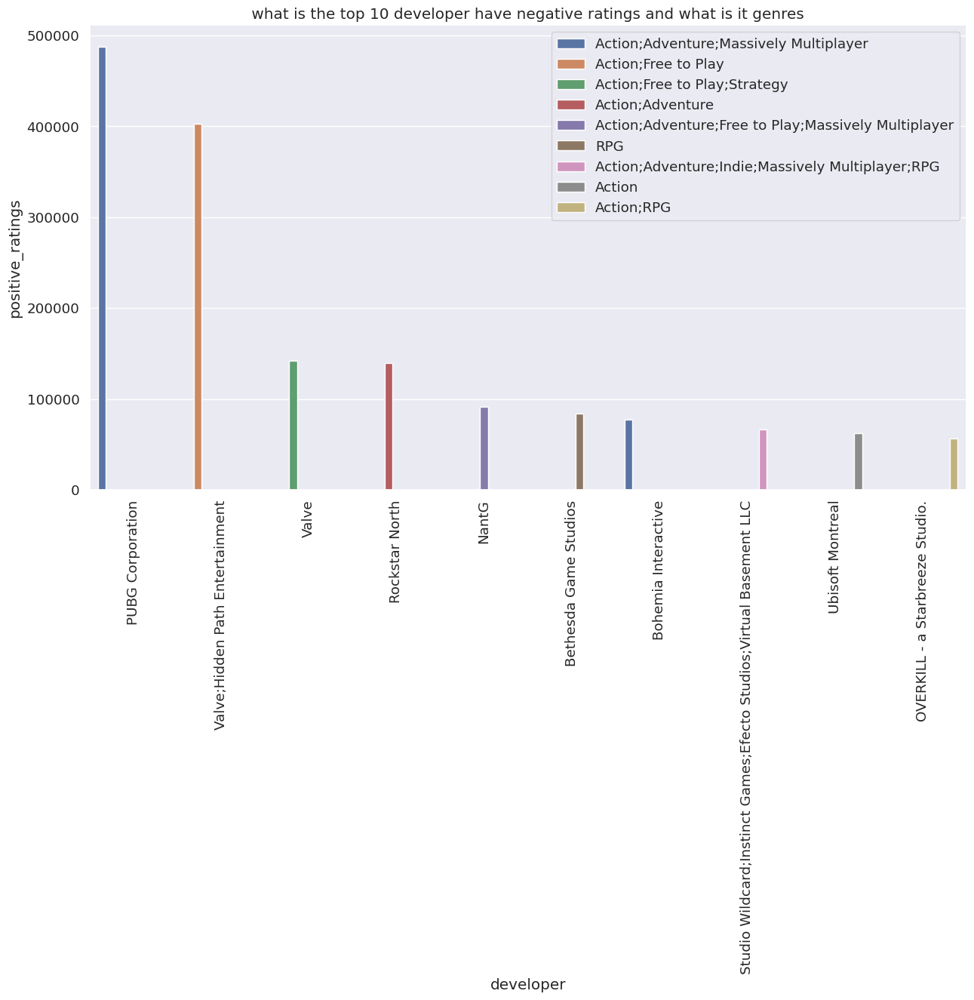

In [138]:
#seaborn
plt.figure(figsize=(15,8))
plt.xticks(rotation=90)
sns.barplot(data=data,
             x="developer",
             y="negative_ratings",
           hue="genres")
plt.xlabel("developer")
plt.ylabel("positive_ratings")
plt.title(" what is the top 10 developer have negative ratings and what is it genres ")
plt.legend(loc='upper right')

In [139]:
#ploty
fig=px.bar(data_frame=data,
        x="developer",
        y="negative_ratings",
        text_auto="0.2s",
        color="genres"
        )
fig.update_traces(textfont_size=12,textposition="outside")
fig.update_layout(title_text="what is the top 10 developer have negative ratings and what is it genres",title_x=0.5)

- We note that most genres have the highest negative ratings __[Action/ Free to Play / RPG ]__ from developer compaies like __[Valve / Hidden Path Entertainment / PUBG Corporation	]__

- We conclude that despite these genres and the same developer compaies, they have a very large number of positive ratings and negative ratings, which indicates that they are very popular companies and genres.

-----------------------

----------------------

<a id=section44></a>

# Conclusions

__My Conclusions after analysis this data__

- I suggest that if any company need to success or increase profits it should care who has 16 or 18 age and publish games suitable for ages from 7

- I suggest that if any company need to success or increase profits it should care with genres  __[Action/ Free to Play / RPG ]__

- I recommend if you publish any games you shound support windows platform and language is english